# Week 40

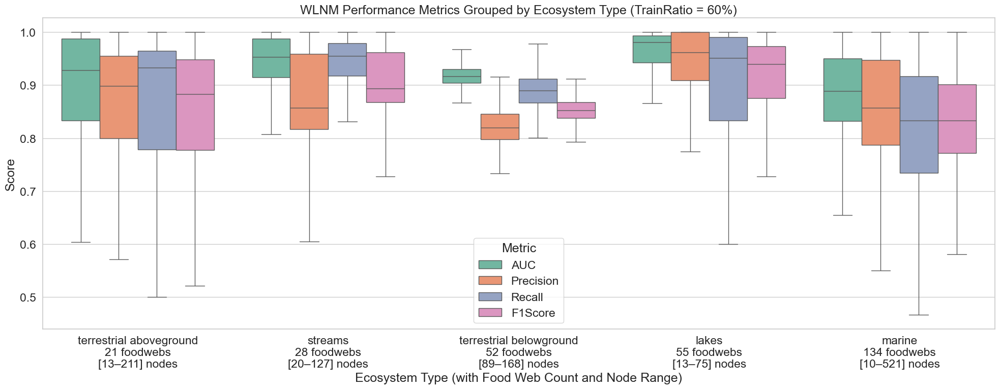

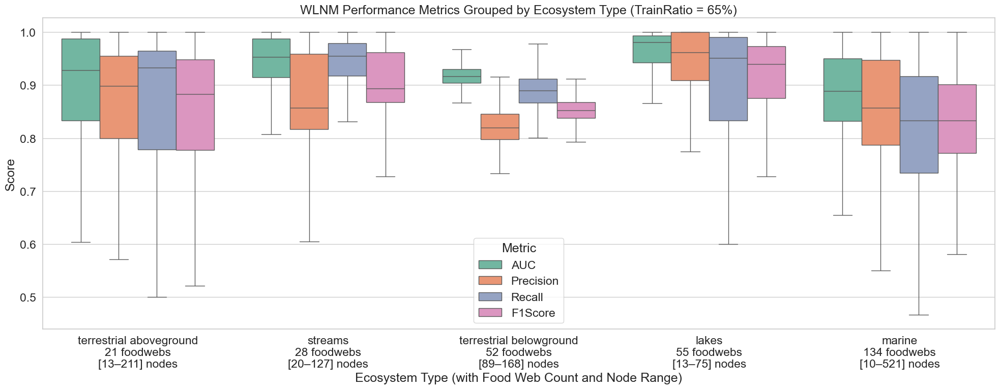

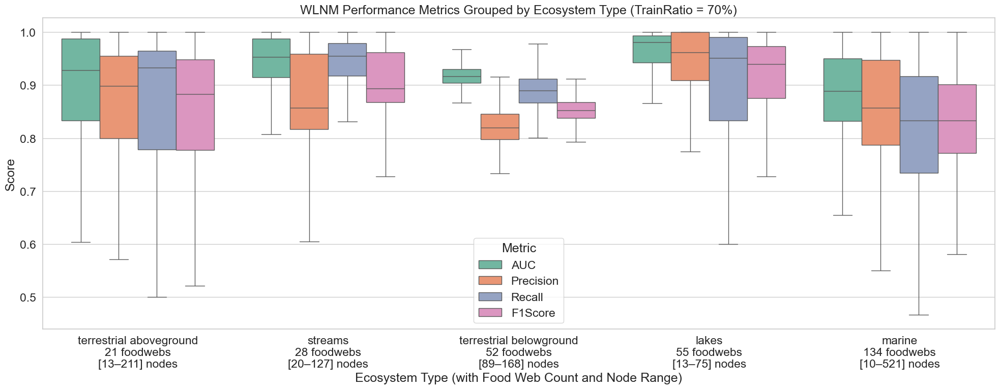

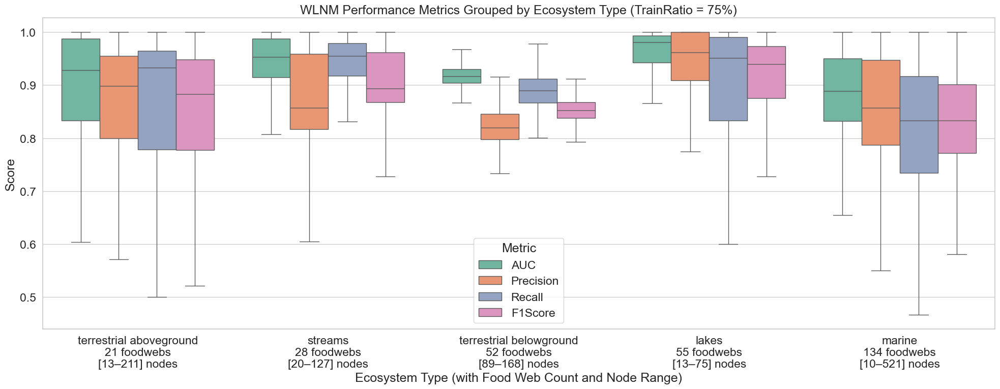

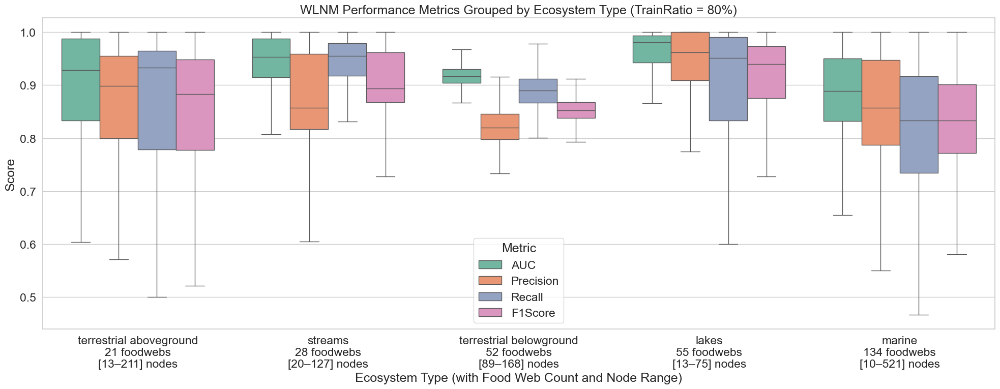

In [1]:
import os
import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

results_dir = "../../src/matlab/data/result_sweep_train_ratios_290/prediction_scores_logs"
ecosystem_file = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"

ecosystem_labels = {
    "terrestrial aboveground": "terrestrial aboveground\n21 foodwebs\n[13–211] nodes",
    "streams": "streams\n28 foodwebs\n[20–127] nodes",
    "terrestrial belowground": "terrestrial belowground\n52 foodwebs\n[89–168] nodes",
    "lakes": "lakes\n55 foodwebs\n[13–75] nodes",
    "marine": "marine\n134 foodwebs\n[10–521] nodes"
}

ecosystem_order = [
    "terrestrial aboveground",
    "streams",
    "terrestrial belowground",
    "lakes",
    "marine"
]

custom_labels = [ecosystem_labels[eco] for eco in ecosystem_order]

df_ecosystem = pd.read_csv(ecosystem_file)

csv_files = glob.glob(os.path.join(results_dir, "*_results_random.csv"))
dfs = []

for file in csv_files:
    df = pd.read_csv(file)

    filename = os.path.basename(file)
    foodweb = filename.split("_results_")[0]

    df["Foodweb"] = foodweb
    dfs.append(df)

if not dfs:
    raise RuntimeError("No result CSV found. Check the path or pattern.")

df_all = pd.concat(dfs, ignore_index=True)

df_merged = pd.merge(df_all, df_ecosystem[["Foodweb", "ecosystem.type"]], on="Foodweb", how="left")

df_plot = df_merged.melt(
    id_vars=["Foodweb", "TrainRatio", "ecosystem.type", "Iteration"],
    value_vars=["AUC", "Precision", "Recall", "F1Score"],
    var_name="Metric",
    value_name="Value"
)

df_plot["TrainRatio"] = df_plot["TrainRatio"].astype(str)

ecosystem_order = (
    df_merged[["Foodweb", "ecosystem.type"]]
    .drop_duplicates()
    .groupby("ecosystem.type")
    .size()
    .sort_values()
    .index
    .tolist()
)

sns.set_theme(style="whitegrid", font_scale=1.5)
train_ratios = sorted(df_plot["TrainRatio"].unique())

for ratio in train_ratios:
    plt.figure(figsize=(20, 8))
    ax = sns.boxplot(
        data=df_plot,
        x="ecosystem.type",
        y="Value",
        hue="Metric",
        palette="Set2",
        showfliers=False,
        order=ecosystem_order,
    )

    ax.set_title(f"WLNM Performance Metrics Grouped by Ecosystem Type (TrainRatio = {ratio}%)")
    ax.set_ylabel("Score")
    ax.set_xlabel("Ecosystem Type (with Food Web Count and Node Range)")
    ax.set_xticks(range(len(ecosystem_order)))
    ax.set_xticklabels(custom_labels)
    plt.legend(title="Metric")
    plt.tight_layout()
    plt.show()

Filtered food webs by size: kept 290 / 290 (>= 0 nodes).


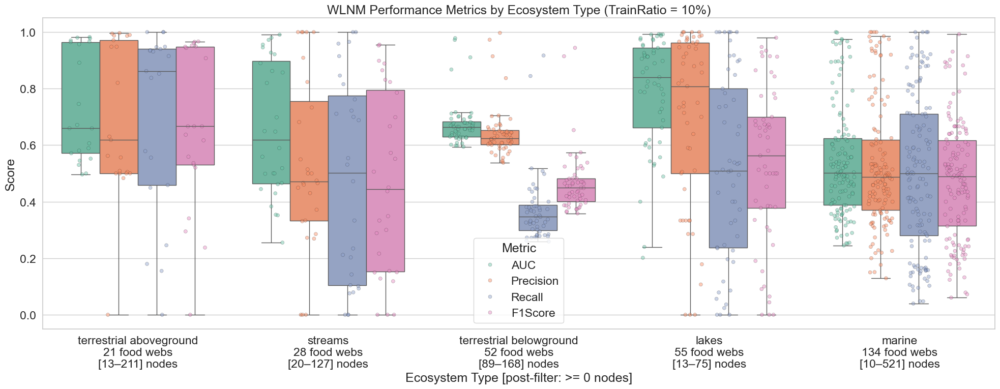

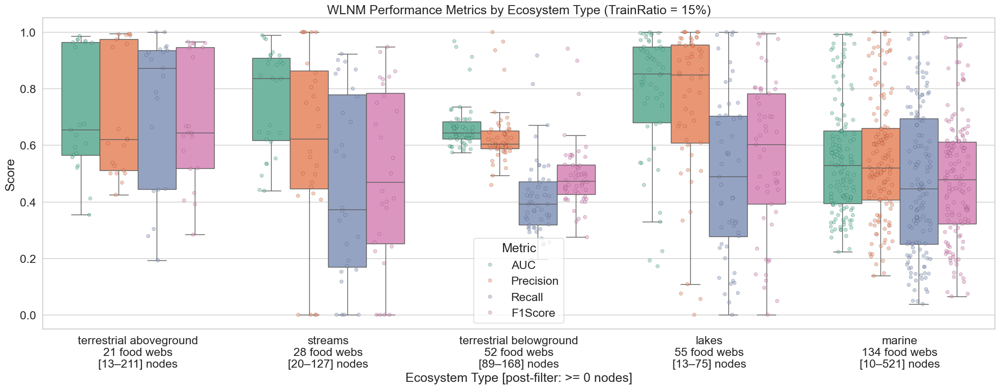

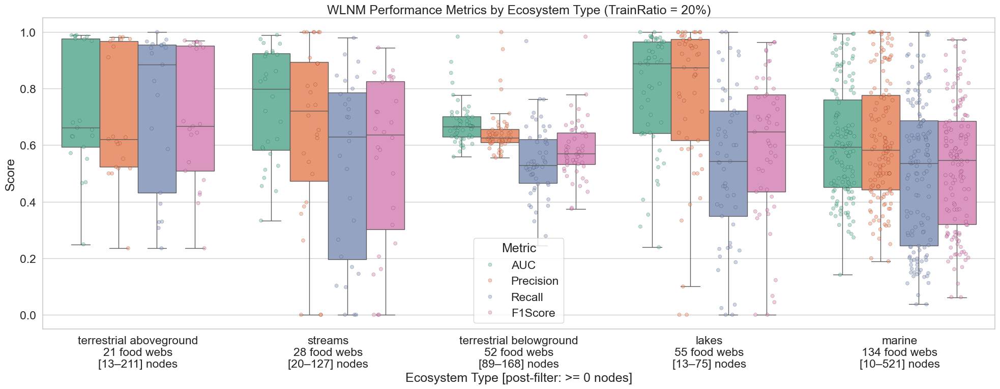

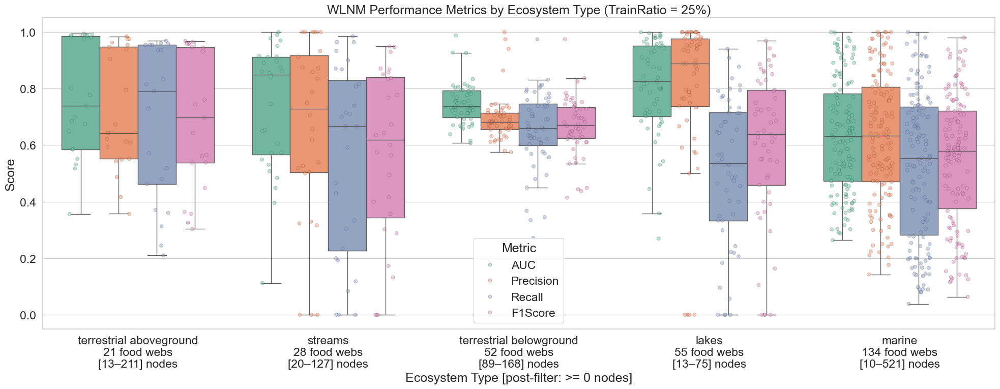

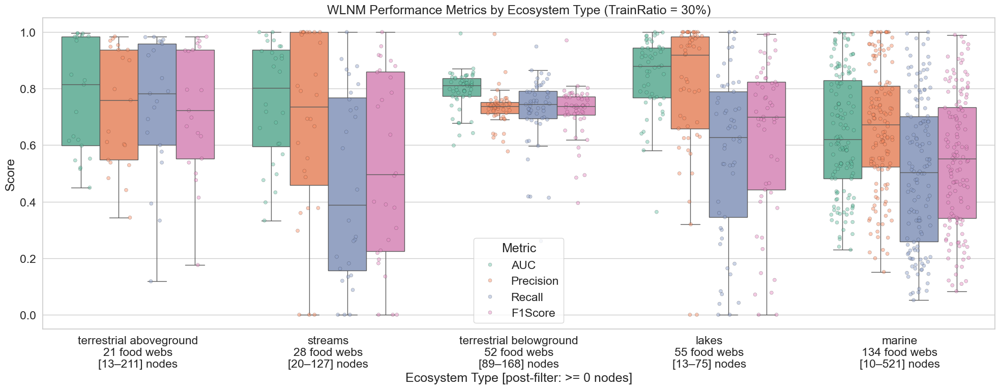

...

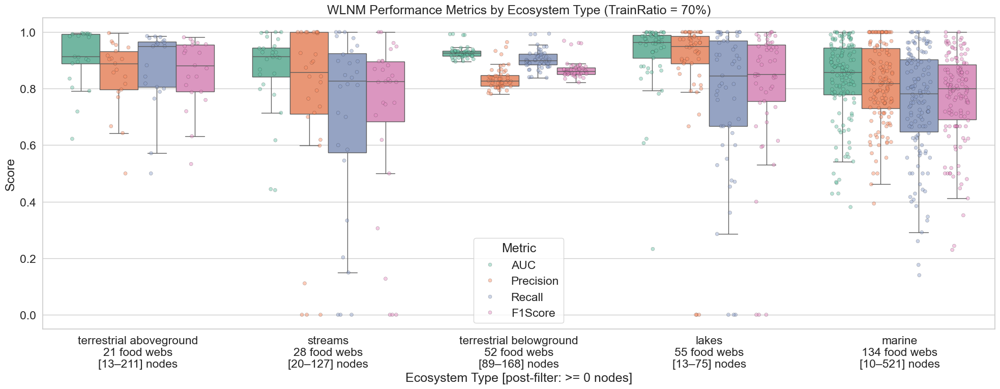

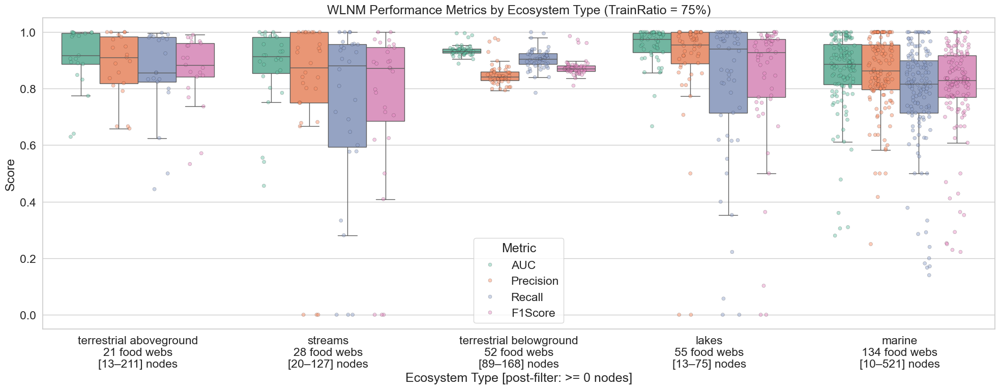

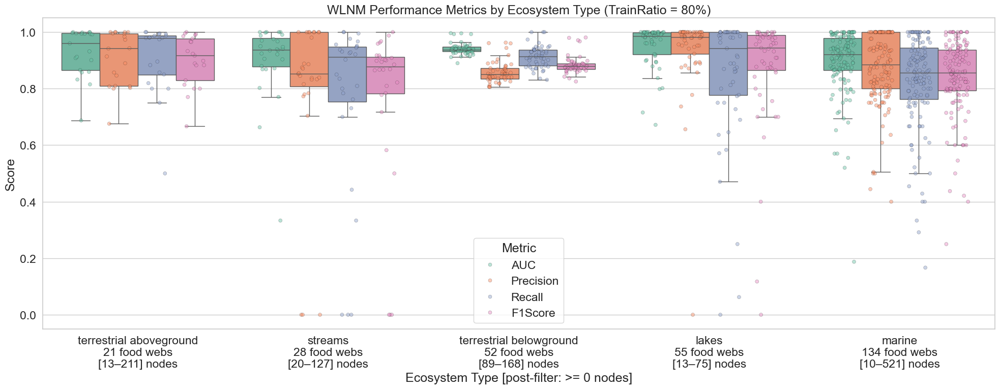

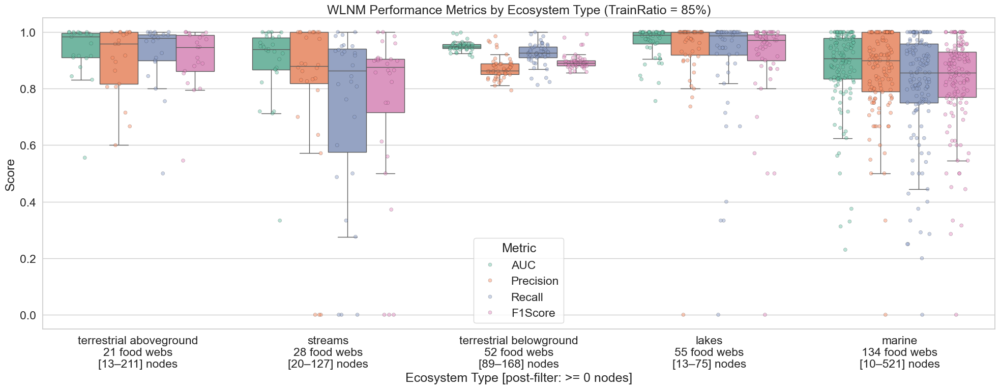

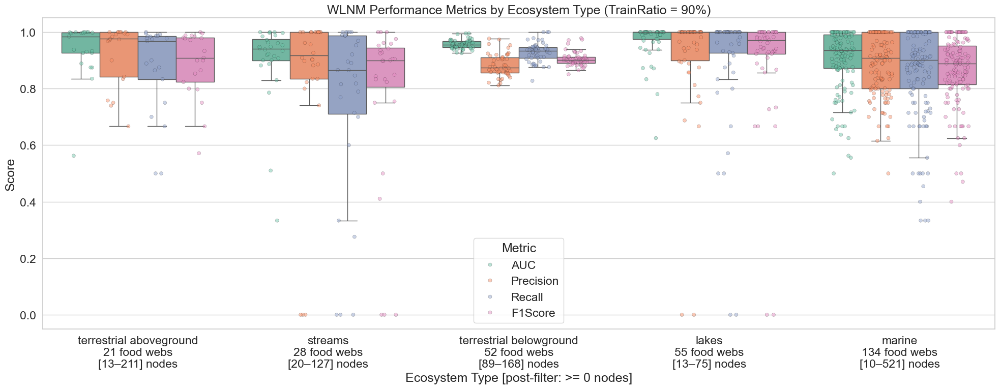

In [2]:
import os
import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === Paths ===
results_dir = "../../src/matlab/data/result/prediction_scores_logs"
ecosystem_file = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"

# === Filtering threshold ===
MIN_NODES = 0  # exclude food webs smaller than this

# === Load ecosystem metadata ===
df_ecosystem = pd.read_csv(ecosystem_file)

# --- Detect a node-count column robustly ---
def _normalize(s: str) -> str:
    return (
        s.strip().lower()
        .replace(" ", "")
        .replace(".", "")
        .replace("-", "")
        .replace("_", "")
    )

candidates = {
    "n_nodes", "num_nodes", "nodes", "nodecount", "n", "s",
    "species", "numspecies", "numberofspecies", "speciescount"
}
norm_map = {_normalize(c): c for c in df_ecosystem.columns}
node_col = None
for k in candidates:
    if k in norm_map:
        node_col = norm_map[k]
        break

if node_col is None:
    raise RuntimeError(
        "Could not find a node-count column in ecosystem metadata. "
        "Please add one (e.g., 'S', 'nodes', 'num_species', 'node_count')."
    )

# === Load result CSVs and stack ===
csv_files = glob.glob(os.path.join(results_dir, "*_results_random.csv"))
dfs = []
for file in csv_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    foodweb = filename.split("_results_")[0]
    df["Foodweb"] = foodweb
    dfs.append(df)

if not dfs:
    raise RuntimeError("No result CSV found. Check the path or pattern.")

df_all = pd.concat(dfs, ignore_index=True)

# === Merge metrics with ecosystem metadata (ecosystem + node count) ===
meta_cols = ["Foodweb", "ecosystem.type", node_col]
df_merged = pd.merge(df_all, df_ecosystem[meta_cols], on="Foodweb", how="left")

# === Apply node-count filter ===
before_n = df_merged["Foodweb"].nunique()
df_merged = df_merged[df_merged[node_col] >= MIN_NODES].copy()
after_n = df_merged["Foodweb"].nunique()
print(f"Filtered food webs by size: kept {after_n} / {before_n} (>= {MIN_NODES} nodes).")

# === Prepare data for plotting ===
df_plot = df_merged.melt(
    id_vars=["Foodweb", "TrainRatio", "ecosystem.type", "Iteration"],
    value_vars=["AUC", "Precision", "Recall", "F1Score"],
    var_name="Metric",
    value_name="Value"
)

# Cast TrainRatio to string for cleaner facet/legend titles if desired
df_plot["TrainRatio"] = df_plot["TrainRatio"].astype(str)

# === Order ecosystems by count (after filtering) ===
ecosystem_order = (
    df_merged[["Foodweb", "ecosystem.type"]]
    .drop_duplicates()
    .groupby("ecosystem.type")
    .size()
    .sort_values()
    .index
    .tolist()
)

# === Build dynamic x-axis labels with counts and node ranges (after filtering) ===
def make_label(group: pd.DataFrame) -> str:
    n_webs = group["Foodweb"].nunique()
    node_min = int(group[node_col].min())
    node_max = int(group[node_col].max())
    name = group.name  # ecosystem.type value
    return f"{name}\n{n_webs} food webs\n[{node_min}–{node_max}] nodes"

labels_map = {}
for eco in ecosystem_order:
    grp = df_merged[df_merged["ecosystem.type"] == eco]
    if grp.empty:
        continue
    grp.name = eco
    labels_map[eco] = make_label(grp)

custom_labels = [labels_map[eco] for eco in ecosystem_order if eco in labels_map]

# === Plot ALL TrainRatios and overlay points (one figure per ratio) ===
sns.set_theme(style="whitegrid", font_scale=1.5)

# Get unique ratios (as numbers) and loop
all_ratios = sorted(df_plot["TrainRatio"].astype(float).unique())

for ratio in all_ratios:
    subset = df_plot[df_plot["TrainRatio"].astype(float) == ratio].copy()
    if subset.empty:
        continue

    plt.figure(figsize=(20, 8))

    # Boxplot (no outliers; points overlaid below)
    ax = sns.boxplot(
        data=subset,
        x="ecosystem.type",
        y="Value",
        hue="Metric",
        palette="Set2",
        showfliers=False,
        order=ecosystem_order,
    )

    # Jittered individual points
    sns.stripplot(
        data=subset,
        x="ecosystem.type",
        y="Value",
        hue="Metric",
        palette="Set2",
        dodge=True,
        jitter=0.25,
        alpha=0.45,
        linewidth=0.3,
        edgecolor="black",
        order=ecosystem_order,
        zorder=2,
    )

    # De-duplicate legend
    handles, labels = ax.get_legend_handles_labels()
    uniq = dict(zip(labels, handles))
    ax.legend(uniq.values(), uniq.keys(), title="Metric", frameon=True, loc="lower center")

    ax.set_title(f"WLNM Performance Metrics by Ecosystem Type (TrainRatio = {ratio:g}%)")
    ax.set_ylabel("Score")
    ax.set_xlabel(f"Ecosystem Type [post-filter: >= {MIN_NODES} nodes]")
    ax.set_xticks(range(len(custom_labels)))
    ax.set_xticklabels(custom_labels)
    plt.tight_layout()
    plt.show()

Filtered food webs by size: kept 290 / 290 (>= 1 nodes).


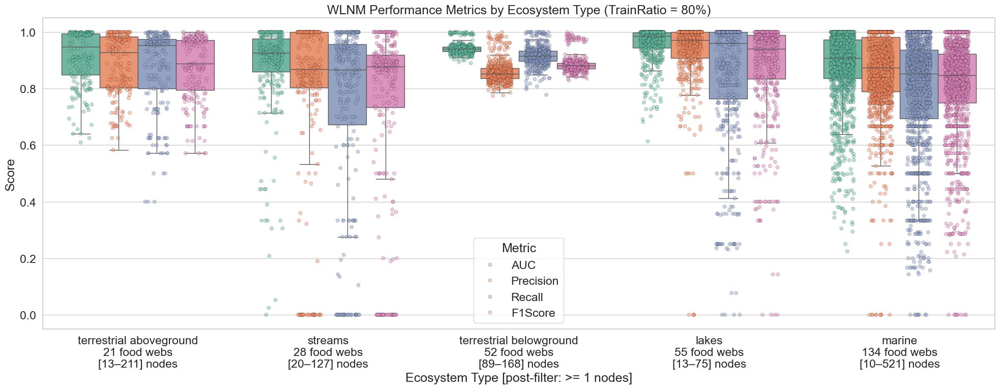

In [3]:
import os
import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === Paths ===
results_dir = "../../src/matlab/data/result_stable_version_290/prediction_scores_logs"
ecosystem_file = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"

# === Filtering threshold ===
MIN_NODES = 1  # exclude food webs smaller than this

# === Load ecosystem metadata ===
df_ecosystem = pd.read_csv(ecosystem_file)

# --- Detect a node-count column robustly ---
def _normalize(s: str) -> str:
    return (
        s.strip().lower()
        .replace(" ", "")
        .replace(".", "")
        .replace("-", "")
        .replace("_", "")
    )

candidates = {
    "n_nodes", "num_nodes", "nodes", "nodecount", "n", "s",
    "species", "numspecies", "numberofspecies", "speciescount"
}
norm_map = {_normalize(c): c for c in df_ecosystem.columns}
node_col = None
for k in candidates:
    if k in norm_map:
        node_col = norm_map[k]
        break

if node_col is None:
    raise RuntimeError(
        "Could not find a node-count column in ecosystem metadata. "
        "Please add one (e.g., 'S', 'nodes', 'num_species', 'node_count')."
    )

# === Load result CSVs and stack ===
csv_files = glob.glob(os.path.join(results_dir, "*_results_random.csv"))
dfs = []
for file in csv_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    foodweb = filename.split("_results_")[0]
    df["Foodweb"] = foodweb
    dfs.append(df)

if not dfs:
    raise RuntimeError("No result CSV found. Check the path or pattern.")

df_all = pd.concat(dfs, ignore_index=True)

# === Merge metrics with ecosystem metadata (ecosystem + node count) ===
meta_cols = ["Foodweb", "ecosystem.type", node_col]
df_merged = pd.merge(df_all, df_ecosystem[meta_cols], on="Foodweb", how="left")

# === Apply node-count filter ===
before_n = df_merged["Foodweb"].nunique()
df_merged = df_merged[df_merged[node_col] >= MIN_NODES].copy()
after_n = df_merged["Foodweb"].nunique()
print(f"Filtered food webs by size: kept {after_n} / {before_n} (>= {MIN_NODES} nodes).")

# === Prepare data for plotting ===
df_plot = df_merged.melt(
    id_vars=["Foodweb", "TrainRatio", "ecosystem.type", "Iteration"],
    value_vars=["AUC", "Precision", "Recall", "F1Score"],
    var_name="Metric",
    value_name="Value"
)

# Cast TrainRatio to string for cleaner facet/legend titles if desired
df_plot["TrainRatio"] = df_plot["TrainRatio"].astype(str)

# === Order ecosystems by count (after filtering) ===
ecosystem_order = (
    df_merged[["Foodweb", "ecosystem.type"]]
    .drop_duplicates()
    .groupby("ecosystem.type")
    .size()
    .sort_values()
    .index
    .tolist()
)

# === Build dynamic x-axis labels with counts and node ranges (after filtering) ===
def make_label(group: pd.DataFrame) -> str:
    n_webs = group["Foodweb"].nunique()
    node_min = int(group[node_col].min())
    node_max = int(group[node_col].max())
    name = group.name  # ecosystem.type value
    return f"{name}\n{n_webs} food webs\n[{node_min}–{node_max}] nodes"

labels_map = {}
for eco in ecosystem_order:
    grp = df_merged[df_merged["ecosystem.type"] == eco]
    if grp.empty:
        continue
    grp.name = eco
    labels_map[eco] = make_label(grp)

custom_labels = [labels_map[eco] for eco in ecosystem_order if eco in labels_map]

# === Plot ONLY TrainRatio = 80% and overlay points ===
sns.set_theme(style="whitegrid", font_scale=1.5)

# Robust filter to 80% even if stored as "80" or "80.0"
subset = df_plot[df_plot["TrainRatio"].astype(float) == 80.0].copy()
if subset.empty:
    raise RuntimeError("No rows for TrainRatio = 80.0. Check how TrainRatio is stored.")

plt.figure(figsize=(20, 8))

# Boxplot without outliers (keeps view clean for points)
ax = sns.boxplot(
    data=subset,
    x="ecosystem.type",
    y="Value",
    hue="Metric",
    palette="Set2",
    showfliers=False,
    order=ecosystem_order,
)

# Overlay individual data points (stripplot = jittered dots).
# Use small alpha + linewidth for readability; dodge=True to separate hues.
sns.stripplot(
    data=subset,
    x="ecosystem.type",
    y="Value",
    hue="Metric",
    palette="Set2",
    dodge=True,
    jitter=0.25,
    alpha=0.45,
    linewidth=0.3,
    edgecolor="black",
    order=ecosystem_order,
    zorder=2,
)

# De-duplicate the legend (boxplot + stripplot both add entries)
handles, labels = ax.get_legend_handles_labels()
uniq = dict(zip(labels, handles))  # keeps last occurrence per label
ax.legend(uniq.values(), uniq.keys(), title="Metric", frameon=True, loc='lower center')

ax.set_title("WLNM Performance Metrics by Ecosystem Type (TrainRatio = 80%)")
ax.set_ylabel("Score")
ax.set_xlabel(f"Ecosystem Type [post-filter: >= {MIN_NODES} nodes]")
ax.set_xticks(range(len(custom_labels)))
ax.set_xticklabels(custom_labels)
plt.tight_layout()
plt.show()

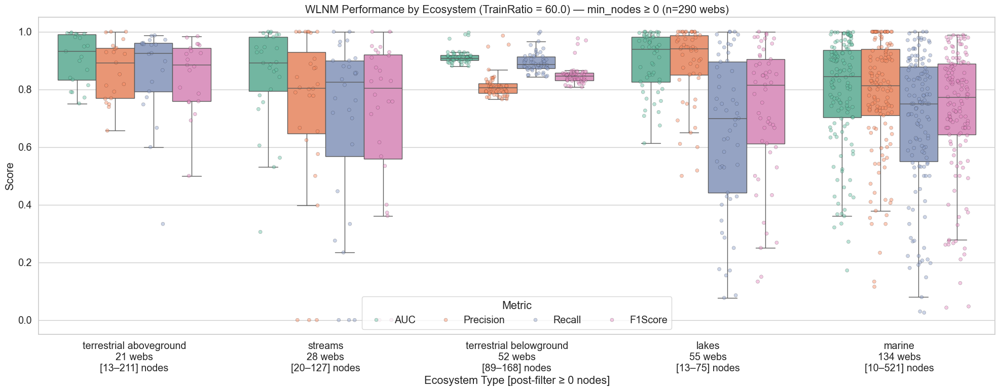

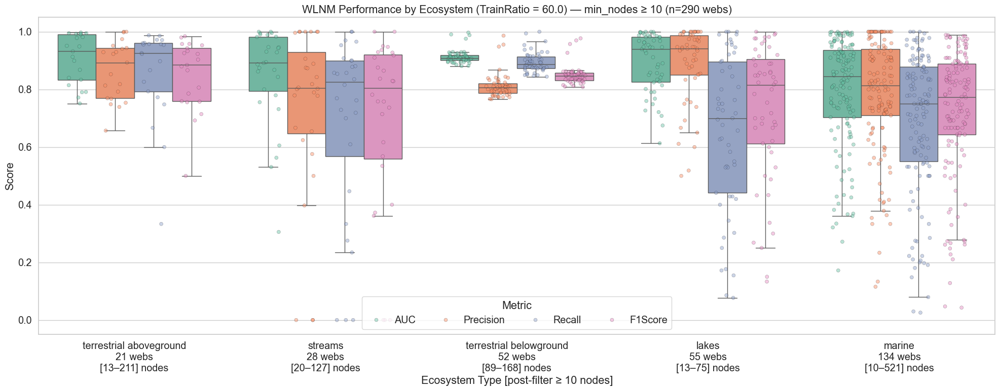

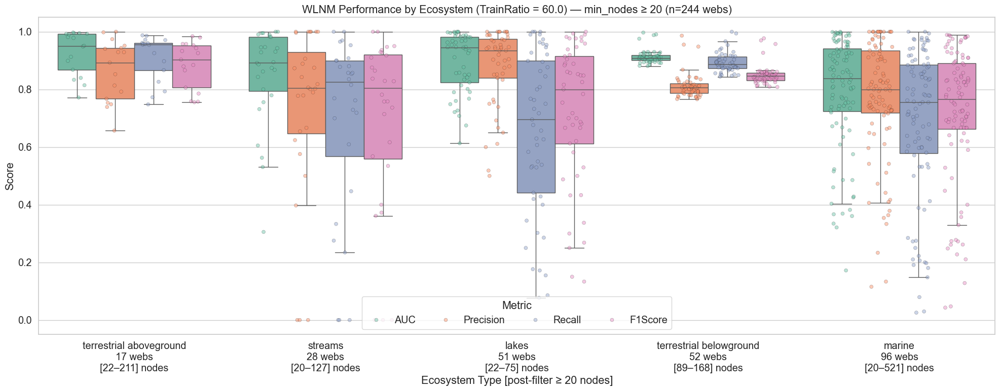

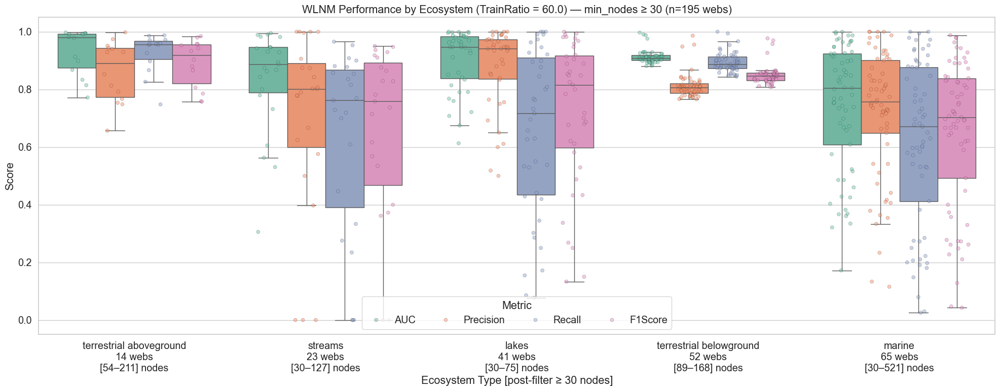

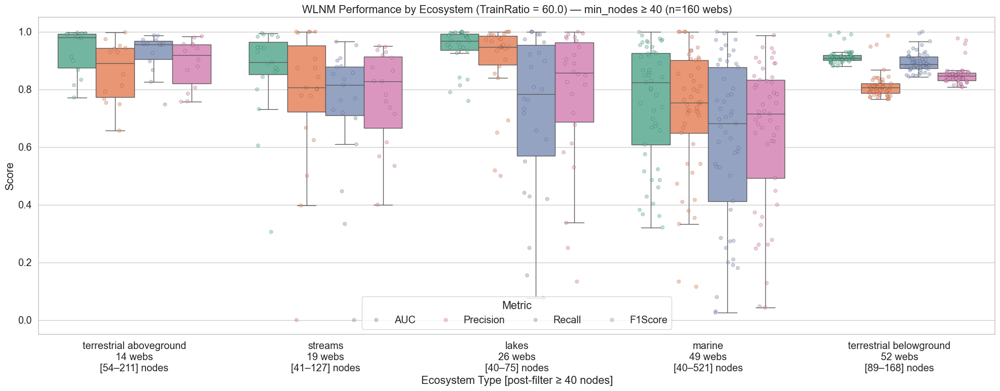

...

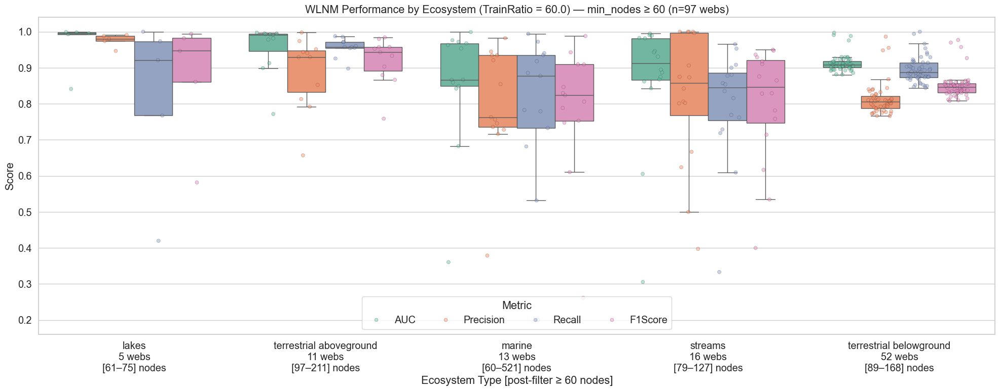

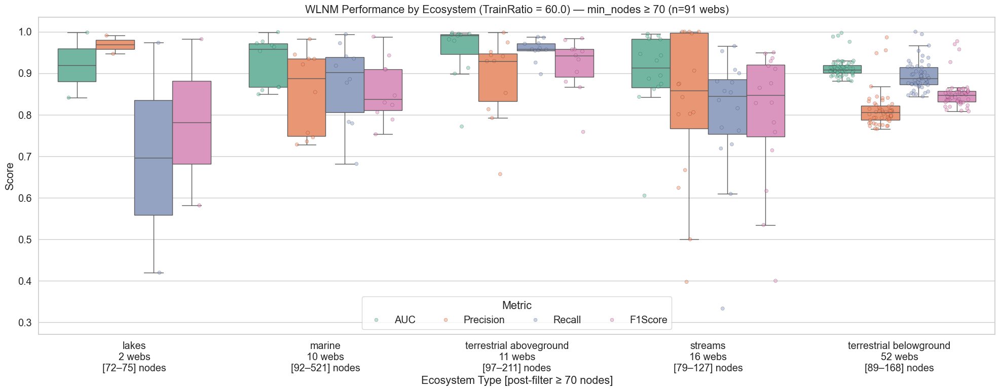

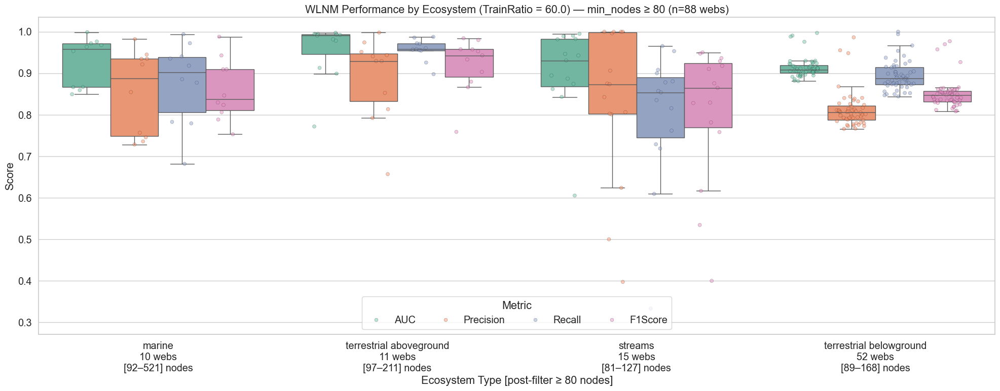

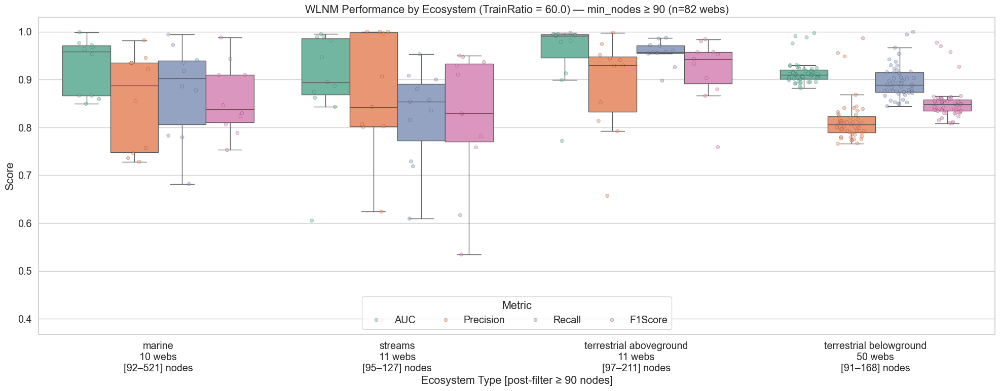

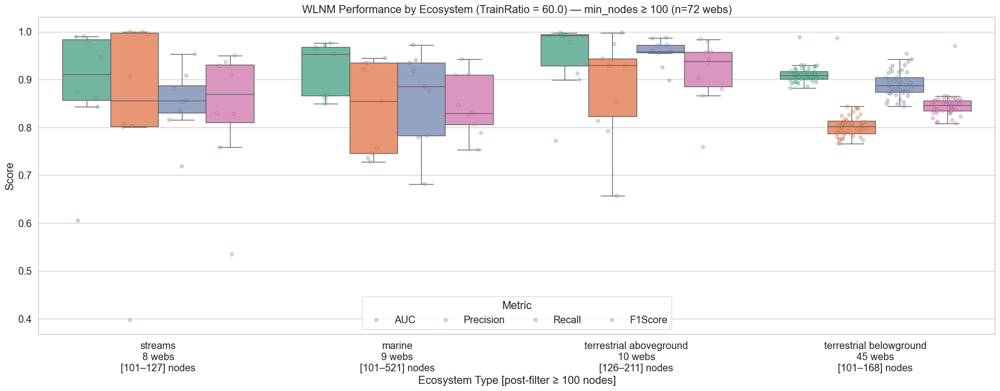

In [1]:
import os
import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Paths ---
results_dir = "../../src/matlab/data/result/prediction_scores_logs"
ecosystem_file = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
train_ratio = 60.0

sns.set_theme(style="whitegrid", font_scale=1.3)

# --- Load ecosystem metadata ---
df_ecosystem = pd.read_csv(ecosystem_file)

def _normalize(s: str) -> str:
    return s.strip().lower().replace(" ", "").replace(".", "").replace("-", "").replace("_", "")

candidates = {
    "n_nodes","num_nodes","nodes","nodecount","n","s",
    "species","numspecies","numberofspecies","speciescount"
}
norm_map = {_normalize(c): c for c in df_ecosystem.columns}
node_col = next((norm_map[k] for k in candidates if k in norm_map), None)
if node_col is None:
    raise RuntimeError("Could not find a node-count column in metadata (e.g. 'S', 'nodes').")

# --- Load result CSVs and stack ---
csv_files = glob.glob(os.path.join(results_dir, "*_results_random.csv"))
dfs = []
for file in csv_files:
    df = pd.read_csv(file)
    foodweb = os.path.basename(file).split("_results_")[0]
    df["Foodweb"] = foodweb
    dfs.append(df)
if not dfs:
    raise RuntimeError("No result CSV found. Check the path or pattern.")
df_all = pd.concat(dfs, ignore_index=True)

# --- Merge results with ecosystem metadata once (no filter yet) ---
meta_cols = ["Foodweb", "ecosystem.type", node_col]
base = pd.merge(df_all, df_ecosystem[meta_cols], on="Foodweb", how="left")

# Helper: normalize TrainRatio to 0–100 scale regardless of how stored
def to_percent(s: pd.Series) -> pd.Series:
    sr = pd.to_numeric(s, errors="coerce")
    if sr.dropna().max() <= 1.000001:  # stored as 0.0–1.0
        sr = sr * 100
    return sr

# --- Sweep thresholds 10,20,...,100 ---
for min_nodes in range(0, 101, 10):
    dfm = base[base[node_col] >= min_nodes].copy()
    n_webs = dfm["Foodweb"].nunique()
    if dfm.empty or n_webs == 0:
        print(f"[min_nodes={min_nodes}] No food webs remain after filtering. Skipping.")
        continue

    # Prepare data for plotting
    df_plot = dfm.melt(
        id_vars=["Foodweb", "TrainRatio", "ecosystem.type", "Iteration"],
        value_vars=["AUC", "Precision", "Recall", "F1Score"],
        var_name="Metric",
        value_name="Value"
    )
    df_plot["TrainRatio_pct"] = to_percent(df_plot["TrainRatio"])

    # Subset to TrainRatio = 80%
    subset = df_plot[df_plot["TrainRatio_pct"].round(3) == train_ratio].copy()
    if subset.empty:
        print(f"[min_nodes={min_nodes}] No rows for TrainRatio=80%. Skipping.")
        continue

    # Order ecosystems (after filtering)
    ecosystem_order = (
        dfm[["Foodweb", "ecosystem.type"]]
        .drop_duplicates()
        .groupby("ecosystem.type")
        .size()
        .sort_values()
        .index
        .tolist()
    )

    # Build dynamic x-axis labels (counts + node range, after filtering)
    def make_label(group: pd.DataFrame) -> str:
        n_webs_g = group["Foodweb"].nunique()
        node_min = int(group[node_col].min())
        node_max = int(group[node_col].max())
        name = group.name
        return f"{name}\n{n_webs_g} webs\n[{node_min}–{node_max}] nodes"

    labels_map = {}
    for eco in ecosystem_order:
        grp = dfm[dfm["ecosystem.type"] == eco]
        grp.name = eco
        labels_map[eco] = make_label(grp)
    custom_labels = [labels_map[e] for e in ecosystem_order]

    # --- Plot: boxplot + points (per-threshold figure) ---
    plt.figure(figsize=(20, 8))
    ax = sns.boxplot(
        data=subset,
        x="ecosystem.type",
        y="Value",
        hue="Metric",            # <- hue used, so palette is safe
        hue_order=["AUC","Precision","Recall","F1Score"],
        palette="Set2",
        showfliers=False,
        order=ecosystem_order,
        dodge=True
    )

    sns.stripplot(
        data=subset,
        x="ecosystem.type",
        y="Value",
        hue="Metric",
        hue_order=["AUC","Precision","Recall","F1Score"],
        palette="Set2",
        dodge=True,
        jitter=0.25,
        alpha=0.45,
        linewidth=0.3,
        edgecolor="black",
        order=ecosystem_order,
        zorder=2
    )

    # De-duplicate legend (boxplot + stripplot each add entries)
    handles, labels = ax.get_legend_handles_labels()
    uniq = dict(zip(labels, handles))
    ax.legend(uniq.values(), uniq.keys(), title="Metric", frameon=True, loc="lower center", ncol=4)

    ax.set_title(f"WLNM Performance by Ecosystem (TrainRatio = {train_ratio}) — min_nodes ≥ {min_nodes} (n={n_webs} webs)")
    ax.set_ylabel("Score")
    ax.set_xlabel(f"Ecosystem Type [post-filter ≥ {min_nodes} nodes]")
    ax.set_xticks(range(len(custom_labels)))
    ax.set_xticklabels(custom_labels)

    plt.tight_layout()
    plt.show()

Filtered by node count ≥ 0: kept 290 of 290 food webs.


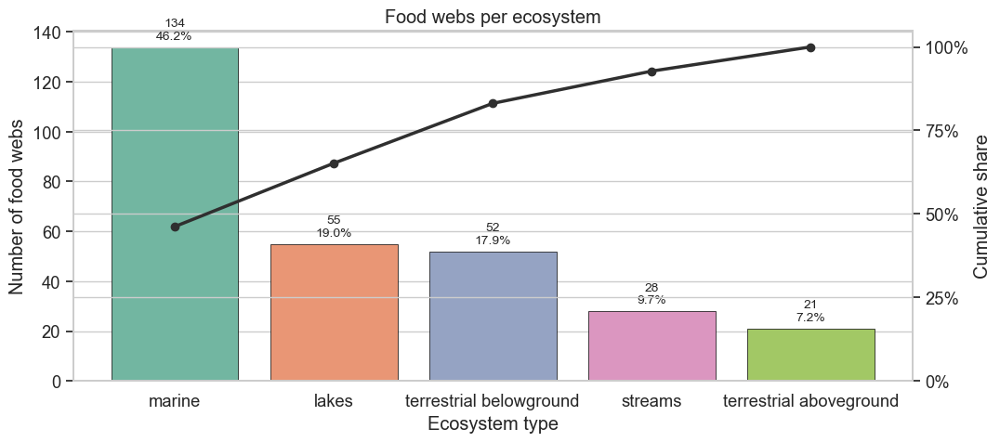

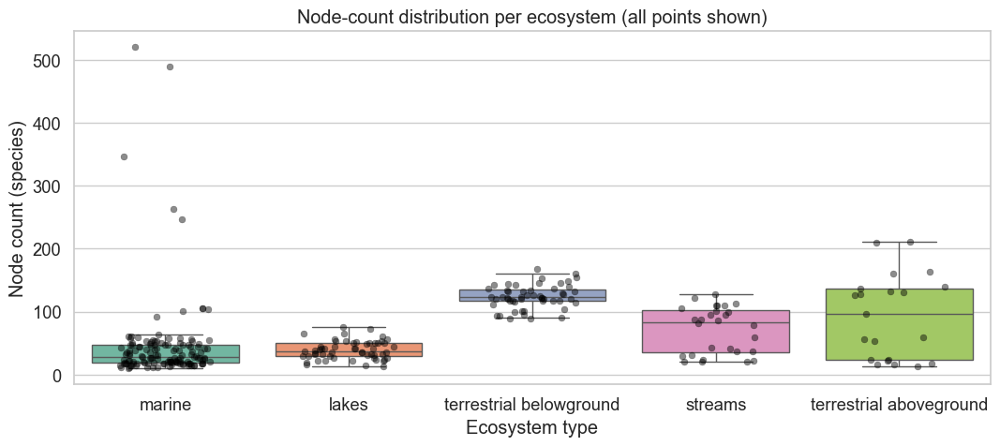

In [5]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator
from IPython.display import display

# === Paths ===
ecosystem_file = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"

# === Config ===
MIN_NODES = 0          # filter out webs with < MIN_NODES
CAP_Q = 0.95            # cap y-axis at this quantile for the boxplot

sns.set_theme(style="whitegrid", font_scale=1.2)

# --- Load metadata ---
df = pd.read_csv(ecosystem_file)

# --- Robustly detect a node-count column ---
def _norm(s): 
    return str(s).strip().lower().replace(" ", "").replace(".", "").replace("-", "").replace("_", "")

cands = {
    "s","n","nodes","nodecount","n_nodes","num_nodes","numspecies","species","speciescount","numberofspecies"
}
norm_cols = {_norm(c): c for c in df.columns}
node_col = next((norm_cols[c] for c in cands if c in norm_cols), None)
if node_col is None:
    raise RuntimeError("No node-count column found. Add one like 'S', 'nodes', or 'num_species'.")

# --- Basic hygiene ---
if "ecosystem.type" not in df.columns:
    raise RuntimeError("Missing 'ecosystem.type' column in the CSV.")
df["ecosystem.type"] = df["ecosystem.type"].fillna("Unknown")

# Ensure 1 row per Foodweb (keep first if duplicates exist)
if "Foodweb" in df.columns:
    df = df.sort_values(["Foodweb"]).drop_duplicates("Foodweb", keep="first")

# --- Optional size filter ---
if MIN_NODES is not None:
    before = df["Foodweb"].nunique() if "Foodweb" in df.columns else len(df)
    df = df[df[node_col] >= MIN_NODES].copy()
    after  = df["Foodweb"].nunique() if "Foodweb" in df.columns else len(df)
    print(f"Filtered by node count ≥ {MIN_NODES}: kept {after} of {before} food webs.")

# === Counts per ecosystem (for Pareto + ordering) ===
counts = (
    df.groupby("ecosystem.type", dropna=False)
      .size()
      .rename("count")
      .sort_values(ascending=False)
      .reset_index()
)
total = counts["count"].sum()
counts["prop"] = counts["count"] / total
counts["cum_prop"] = counts["prop"].cumsum()
counts["percent"] = (100*counts["prop"]).round(1)
counts["cum_percent"] = (100*counts["cum_prop"]).round(1)

# === Colors & order ===
order = counts["ecosystem.type"].tolist()
palette_list = sns.color_palette("Set2", n_colors=len(order))
palette_map = dict(zip(order, palette_list))
cum_line_color = "#2f2f2f"  # dark grey for cumulative line

plt.figure(figsize=(11, 5))
ax = sns.barplot(
    data=counts,
    x="ecosystem.type",
    y="count",
    order=order,
    hue="ecosystem.type",     # <- add hue
    hue_order=order,
    dodge=False,              # <- keep one bar per x
    palette=palette_map,      # <- your per-ecosystem colors
    edgecolor="black",
    linewidth=0.5,
    legend=False              # <- suppress legend (Seaborn ≥0.13)
)
ax.set_xlabel("Ecosystem type")
ax.set_ylabel("Number of food webs")

# Cumulative share line (distinct color)
ax2 = ax.twinx()
ax2.plot(
    range(len(counts)),
    counts["cum_prop"],
    marker="o",
    linestyle="-",
    linewidth=2.5,
    color=cum_line_color,
)
ax2.set_ylim(0, 1.05)
ax2.set_ylabel("Cumulative share")
ax2.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
ax2.set_yticklabels([f"{y:.0%}" for y in ax2.get_yticks()])

# Annotate bars with counts and %
for p, pct in zip(ax.patches, counts["percent"]):
    ax.annotate(f"{int(p.get_height())}\n{pct:.1f}%",
                (p.get_x() + p.get_width()/2, p.get_height()),
                ha="center", va="bottom", fontsize=10, xytext=(0,4), textcoords="offset points")

plt.title(
    f"Food webs per ecosystem (post-filter: ≥ {MIN_NODES} nodes)"
    if MIN_NODES else "Food webs per ecosystem"
)
plt.tight_layout()
plt.show()

# Compute a global cap for the y-axis; hide dots above the cap
ycap = float(df[node_col].quantile(CAP_Q))
n_above = int((df[node_col] > ycap).sum())

plt.figure(figsize=(11, 5))
ax = sns.boxplot(
    data=df,
    x="ecosystem.type",
    y=node_col,
    order=order,
    hue="ecosystem.type",   # map colors via hue (fixes warning)
    hue_order=order,
    dodge=False,
    showfliers=False,       # stripplot will show all points
    palette=palette_map,
    legend=False
)

# Overlay ALL observations
sns.stripplot(
    data=df,
    x="ecosystem.type",
    y=node_col,
    order=order,
    color="black",
    alpha=0.45,
    jitter=0.25,
    linewidth=0.3,
)

# Let matplotlib auto-scale the full range (no ylim cap)
ax.set_xlabel("Ecosystem type")
ax.set_ylabel("Node count (species)")
plt.title("Node-count distribution per ecosystem (all points shown)")
plt.tight_layout()
plt.show()

In [6]:
# Counts table (Pareto summary)
counts_table = counts[["ecosystem.type", "count", "percent", "cum_percent"]].rename(
    columns={"ecosystem.type":"Ecosystem", "count":"#Webs", "percent":"Percent", "cum_percent":"CumPercent"}
)

# Quartile summary per ecosystem
summary = (
    df.groupby("ecosystem.type")[node_col]
      .agg(n_webs="count",
           min="min",
           q1=lambda s: s.quantile(0.25),
           median="median",
           q3=lambda s: s.quantile(0.75),
           max="max",
           mean="mean",
           std="std")
      .reindex(order)
      .round(2)
      .reset_index()
      .rename(columns={"ecosystem.type":"Ecosystem"})
)

display(counts_table)
display(summary)

,Ecosystem,#Webs,Percent,CumPercent
0,marine,134,46.2,46.2
1,lakes,55,19.0,65.2
2,terrestrial belowground,52,17.9,83.1
3,streams,28,9.7,92.8
4,terrestrial aboveground,21,7.2,100.0


,Ecosystem,n_webs,min,q1,median,q3,max,mean,std
0,marine,134,10,19.00,28.0,48.0,521,46.35,70.99
1,lakes,55,13,29.50,37.0,50.0,75,39.13,14.50
2,terrestrial belowground,52,89,116.75,122.5,134.5,168,123.69,18.51
3,streams,28,20,35.50,83.5,102.0,127,71.18,36.84
4,terrestrial aboveground,21,13,23.00,97.0,136.0,211,92.05,66.72


# AUC vs Train ratio for Lakes (line + IQR + elbow)

Elbow (knee) at ≈ 40% with median AUC ≈ 0.864


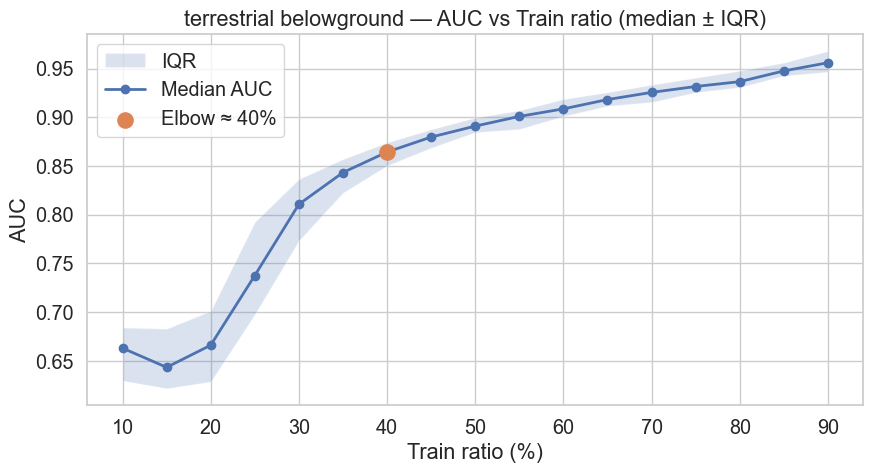

In [17]:
import os
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Paths ---
results_dir = "../../src/matlab/data/result/prediction_scores_logs"
ecosystem_file = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
ecosystem_type = "terrestrial belowground"
score = "AUC"  # one of "AUC", "Precision", "Recall", "F1Score"

sns.set_theme(style="whitegrid", font_scale=1.3)

# --- Load ecosystem metadata ---
df_ecosystem = pd.read_csv(ecosystem_file)

def _normalize(s: str) -> str:
    return s.strip().lower().replace(" ", "").replace(".", "").replace("-", "").replace("_", "")

candidates = {
    "n_nodes","num_nodes","nodes","nodecount","n","s",
    "species","numspecies","numberofspecies","speciescount"
}
norm_map = {_normalize(c): c for c in df_ecosystem.columns}
node_col = next((norm_map[k] for k in candidates if k in norm_map), None)
if node_col is None:
    raise RuntimeError("Could not find a node-count column in metadata (e.g. 'S', 'nodes').")

# --- Load result CSVs and stack ---
csv_files = glob.glob(os.path.join(results_dir, "*_results_random.csv"))
dfs = []
for file in csv_files:
    df = pd.read_csv(file)
    foodweb = os.path.basename(file).split("_results_")[0]
    df["Foodweb"] = foodweb
    dfs.append(df)
if not dfs:
    raise RuntimeError("No result CSV found. Check the path or pattern.")
df_all = pd.concat(dfs, ignore_index=True)

# --- Merge results with ecosystem metadata once (no filter yet) ---
meta_cols = ["Foodweb", "ecosystem.type", node_col]
base = pd.merge(df_all, df_ecosystem[meta_cols], on="Foodweb", how="left")

# Helper: normalize TrainRatio to 0–100 scale regardless of how stored
def to_percent(s: pd.Series) -> pd.Series:
    sr = pd.to_numeric(s, errors="coerce")
    if sr.dropna().max() <= 1.000001:  # stored as 0.0–1.0
        sr = sr * 100
    return sr

# Long format for metrics
df_plot = base.melt(
    id_vars=["Foodweb", "TrainRatio", "ecosystem.type", "Iteration"],
    value_vars=["AUC", "Precision", "Recall", "F1Score"],
    var_name="Metric",
    value_name="Value"
)
# Normalize ratio to percent (handles 0–1 or 0–100 inputs)
df_plot["TrainRatio_pct"] = to_percent(df_plot["TrainRatio"])

ecosystem_score = df_plot[(df_plot["ecosystem.type"] == ecosystem_type) & (df_plot["Metric"] == score)].copy()

# Aggregate per ratio
g = (ecosystem_score.groupby("TrainRatio_pct")["Value"]
        .agg(n="count",
             q25=lambda s: s.quantile(0.25),
             median="median",
             q75=lambda s: s.quantile(0.75))
        .reset_index()
        .dropna(subset=["TrainRatio_pct"])
        .sort_values("TrainRatio_pct"))

if len(g) < 2:
    raise RuntimeError("Need at least two train ratios for an elbow plot.")

# Elbow/knee via max distance to the line connecting first/last point (on [0,1] box)
x = g["TrainRatio_pct"].to_numpy(dtype=float)
y = g["median"].to_numpy(dtype=float)

xn = (x - x.min()) / (x.max() - x.min() + 1e-12)
yn = (y - y.min()) / (y.max() - y.min() + 1e-12)

p0 = np.array([xn[0], yn[0]])
p1 = np.array([xn[-1], yn[-1]])
v = p1 - p0                         # shape (2,)
w = np.c_[xn, yn] - p0              # shape (n,2)

# 2D "cross product" magnitude: |v_x*w_y - v_y*w_x|
cross_mag = np.abs(v[0] * w[:, 1] - v[1] * w[:, 0])
dist = cross_mag / (np.hypot(v[0], v[1]) + 1e-12)

knee_i = int(dist.argmax())
knee_ratio, knee_auc = x[knee_i], y[knee_i]

# Plot
sns.set_theme(style="whitegrid", font_scale=1.3)
plt.figure(figsize=(9, 5))
plt.fill_between(g["TrainRatio_pct"], g["q25"], g["q75"], alpha=0.2, label="IQR")
plt.plot(g["TrainRatio_pct"], g["median"], marker="o", linewidth=2, label=f"Median {score}")
plt.scatter([knee_ratio], [knee_auc], s=120, zorder=5, label=f"Elbow ≈ {knee_ratio:.0f}%")

plt.xlabel("Train ratio (%)")
plt.ylabel(f"{score}")
plt.title(f"{ecosystem_type} — {score} vs Train ratio (median ± IQR)")
plt.legend()
plt.tight_layout()
print(f"Elbow (knee) at ≈ {knee_ratio:.0f}% with median {score} ≈ {knee_auc:.3f}")
plt.show()

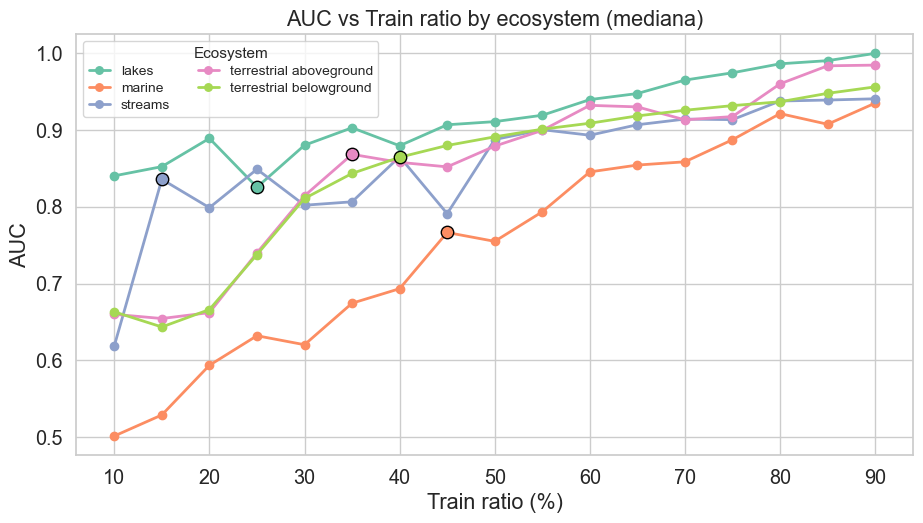

,Ecosystem,Elbow train ratio (%),Elbow median AUC
0,lakes,25.0,0.82540
1,marine,45.0,0.76645
2,streams,15.0,0.83570
3,terrestrial aboveground,35.0,0.86820
4,terrestrial belowground,40.0,0.86440


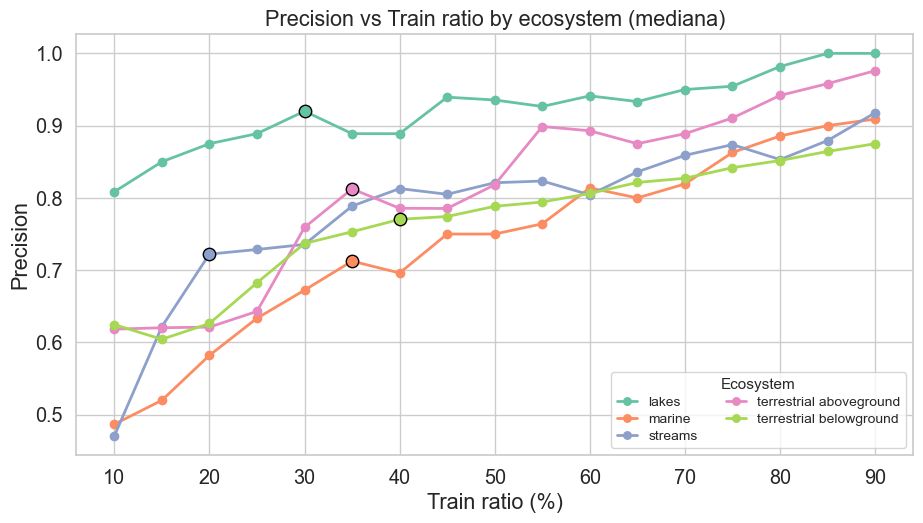

,Ecosystem,Elbow train ratio (%),Elbow median Precision
0,lakes,30.0,0.92000
1,marine,35.0,0.71255
2,streams,20.0,0.72225
3,terrestrial aboveground,35.0,0.81250
4,terrestrial belowground,40.0,0.77035


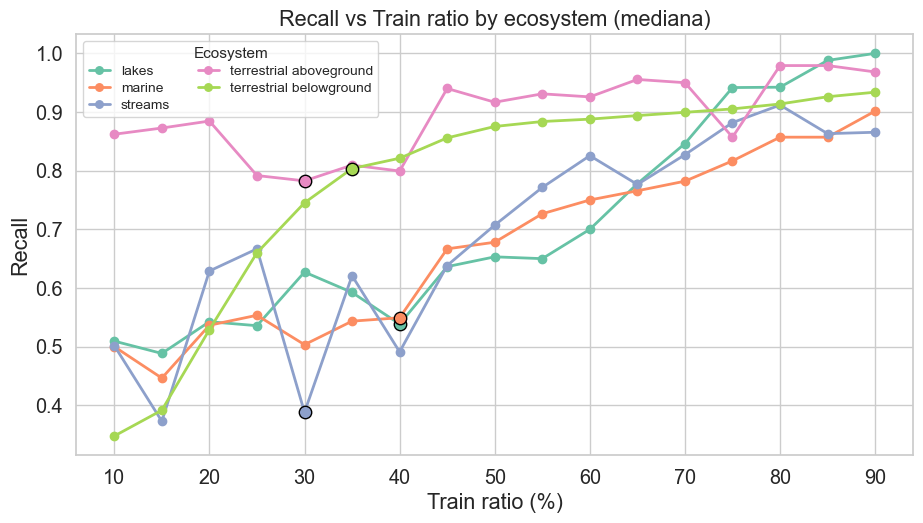

,Ecosystem,Elbow train ratio (%),Elbow median Recall
0,lakes,40.0,0.53850
1,marine,40.0,0.54925
2,streams,30.0,0.38810
3,terrestrial aboveground,30.0,0.78260
4,terrestrial belowground,35.0,0.80365


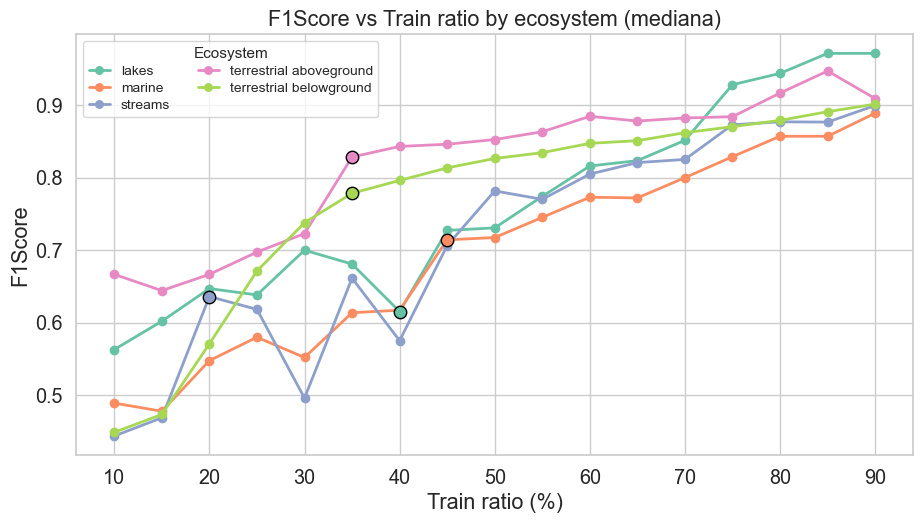

,Ecosystem,Elbow train ratio (%),Elbow median F1Score
0,lakes,40.0,0.6154
1,marine,45.0,0.7143
2,streams,20.0,0.6361
3,terrestrial aboveground,35.0,0.8285
4,terrestrial belowground,35.0,0.7785


In [8]:
import os
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import display

sns.set_theme(style="whitegrid", font_scale=1.25)

# --- Paths ---
results_dir = "../../src/matlab/data/result/prediction_scores_logs"
ecosystem_file = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"

sns.set_theme(style="whitegrid", font_scale=1.3)

# --- Load ecosystem metadata ---
df_ecosystem = pd.read_csv(ecosystem_file)

def _normalize(s: str) -> str:
    return s.strip().lower().replace(" ", "").replace(".", "").replace("-", "").replace("_", "")

candidates = {
    "n_nodes","num_nodes","nodes","nodecount","n","s",
    "species","numspecies","numberofspecies","speciescount"
}
norm_map = {_normalize(c): c for c in df_ecosystem.columns}
node_col = next((norm_map[k] for k in candidates if k in norm_map), None)
if node_col is None:
    raise RuntimeError("Could not find a node-count column in metadata (e.g. 'S', 'nodes').")

# --- Load result CSVs and stack ---
csv_files = glob.glob(os.path.join(results_dir, "*_results_random.csv"))
dfs = []
for file in csv_files:
    df = pd.read_csv(file)
    foodweb = os.path.basename(file).split("_results_")[0]
    df["Foodweb"] = foodweb
    dfs.append(df)
if not dfs:
    raise RuntimeError("No result CSV found. Check the path or pattern.")
df_all = pd.concat(dfs, ignore_index=True)

# --- Merge results with ecosystem metadata once (no filter yet) ---
meta_cols = ["Foodweb", "ecosystem.type", node_col]
base = pd.merge(df_all, df_ecosystem[meta_cols], on="Foodweb", how="left")

# Helper: normalize TrainRatio to 0–100 scale regardless of how stored
def to_percent(s: pd.Series) -> pd.Series:
    sr = pd.to_numeric(s, errors="coerce")
    if sr.dropna().max() <= 1.000001:  # stored as 0.0–1.0
        sr = sr * 100
    return sr

# Long format for metrics
df_plot = base.melt(
    id_vars=["Foodweb", "TrainRatio", "ecosystem.type", "Iteration"],
    value_vars=["AUC", "Precision", "Recall", "F1Score"],
    var_name="Metric",
    value_name="Value"
)
# Normalize ratio to percent (handles 0–1 or 0–100 inputs)
df_plot["TrainRatio_pct"] = to_percent(df_plot["TrainRatio"])

# Asegurar que TrainRatio_pct sea numérico y estable
dfp = df_plot.copy()
dfp["TrainRatio_pct"] = pd.to_numeric(dfp["TrainRatio_pct"], errors="coerce").round(2)

# Colores fijos por ecosistema
ecosystems = sorted(dfp["ecosystem.type"].dropna().unique().tolist())
palette = sns.color_palette("Set2", n_colors=len(ecosystems))
color_map = dict(zip(ecosystems, palette))

def agg_by_metric(metric: str) -> pd.DataFrame:
    m = dfp[dfp["Metric"] == metric].copy()
    out = (m.groupby(["ecosystem.type", "TrainRatio_pct"])["Value"]
             .median()
             .reset_index()
             .dropna(subset=["TrainRatio_pct"])
             .sort_values(["ecosystem.type", "TrainRatio_pct"]))
    return out

def elbows_for_metric(agg: pd.DataFrame) -> pd.DataFrame:
    rows = []
    for eco, geco in agg.groupby("ecosystem.type"):
        x = geco["TrainRatio_pct"].to_numpy(float)
        y = geco["Value"].to_numpy(float)
        if len(geco) < 2:
            continue
        # “codo” = punto con mayor distancia a la cuerda entre los extremos
        xn = (x - x.min()) / (x.max() - x.min() + 1e-12)
        yn = (y - y.min()) / (y.max() - y.min() + 1e-12)
        p0 = np.array([xn[0], yn[0]])
        p1 = np.array([xn[-1], yn[-1]])
        v  = p1 - p0
        w  = np.c_[xn, yn] - p0
        cross_mag = np.abs(v[0]*w[:,1] - v[1]*w[:,0])
        dist = cross_mag / (np.hypot(v[0], v[1]) + 1e-12)
        k = int(dist.argmax())
        rows.append({"ecosystem.type": eco, "TrainRatio_pct": x[k], "score": y[k]})
    return pd.DataFrame(rows)

for metric in ["AUC", "Precision", "Recall", "F1Score"]:
    agg = agg_by_metric(metric)
    elbows = elbows_for_metric(agg)

    plt.figure(figsize=(9.5, 5.5))
    for eco, geco in agg.groupby("ecosystem.type"):
        plt.plot(geco["TrainRatio_pct"], geco["Value"],
                 marker="o", linewidth=2, color=color_map[eco], label=eco)

    if not elbows.empty:
        for _, r in elbows.iterrows():
            plt.scatter(r["TrainRatio_pct"], r["score"], s=80,
                        color=color_map[r["ecosystem.type"]], edgecolor="black", zorder=5)

    plt.xlabel("Train ratio (%)")
    plt.ylabel(metric)
    plt.title(f"{metric} vs Train ratio by ecosystem (mediana)")
    # leyenda compacta por figura
    plt.legend(title="Ecosystem", ncol=2, fontsize=10, title_fontsize=11,
               handlelength=1.5, markerscale=0.9, labelspacing=0.3, frameon=True)
    plt.tight_layout()
    plt.show()

    if not elbows.empty:
        display(elbows.sort_values(["ecosystem.type","TrainRatio_pct"])
                      .rename(columns={"ecosystem.type":"Ecosystem",
                                       "TrainRatio_pct":"Elbow train ratio (%)",
                                       "score":f"Elbow median {metric}"})
                      .reset_index(drop=True))

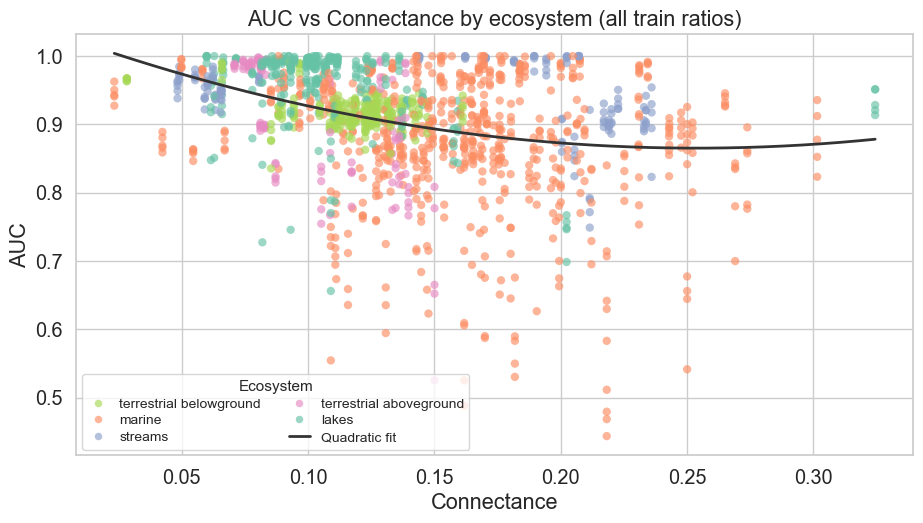

,Ecosystem,n_Foodweb,Spearman rho (AUC ~ Connectance)
0,lakes,55.0,-0.245
1,marine,134.0,-0.134
2,streams,28.0,-0.406
3,terrestrial aboveground,21.0,-0.669
4,terrestrial belowground,52.0,-0.141


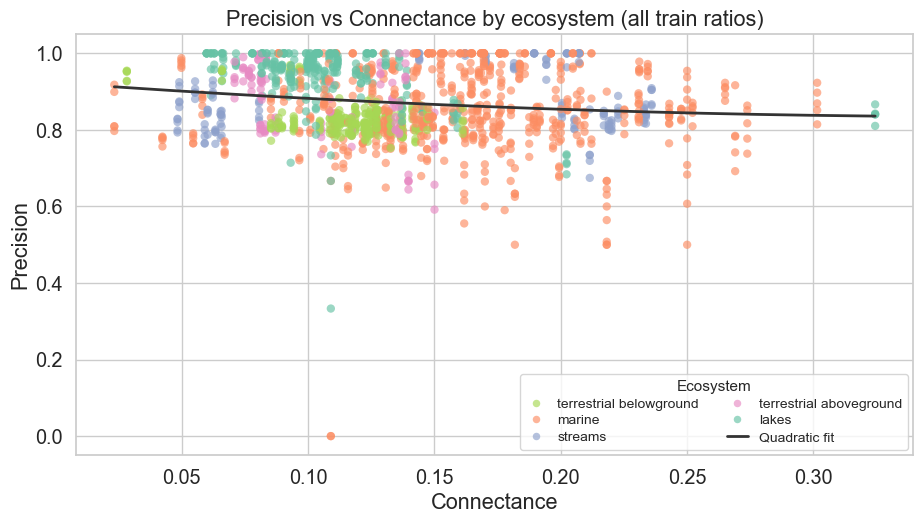

,Ecosystem,n_Foodweb,Spearman rho (Precision ~ Connectance)
0,lakes,55.0,-0.384
1,marine,134.0,0.014
2,streams,28.0,-0.004
3,terrestrial aboveground,21.0,-0.469
4,terrestrial belowground,52.0,-0.134


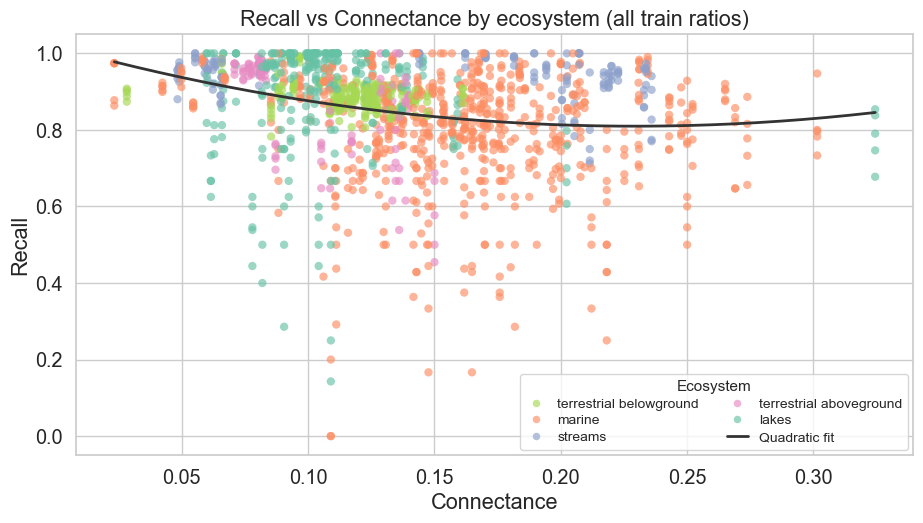

,Ecosystem,n_Foodweb,Spearman rho (Recall ~ Connectance)
0,lakes,55.0,-0.027
1,marine,134.0,-0.155
2,streams,28.0,-0.336
3,terrestrial aboveground,21.0,-0.658
4,terrestrial belowground,52.0,-0.231


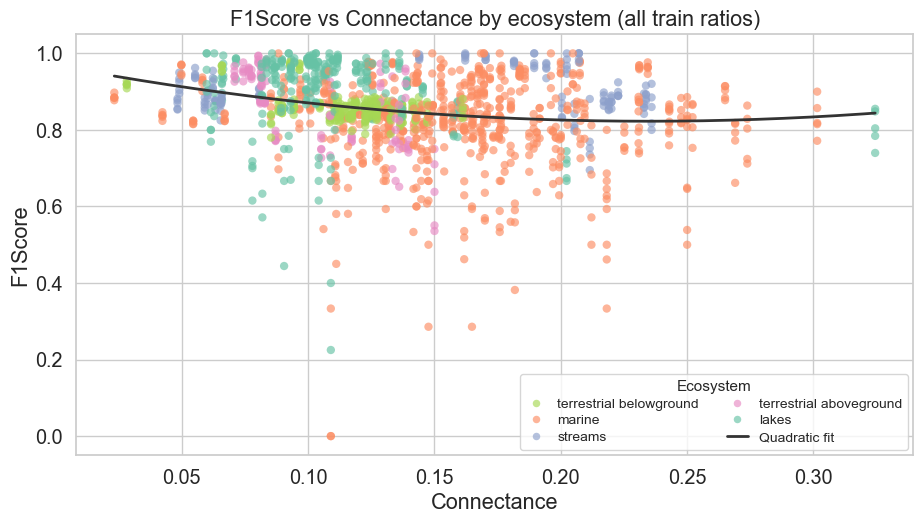

,Ecosystem,n_Foodweb,Spearman rho (F1Score ~ Connectance)
0,lakes,55.0,-0.116
1,marine,134.0,-0.069
2,streams,28.0,-0.155
3,terrestrial aboveground,21.0,-0.684
4,terrestrial belowground,52.0,-0.195


In [9]:
import os, glob, numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
from IPython.display import display

# --- Paths ---
results_dir = "../../src/matlab/data/result_sweep_train_ratios_290/prediction_scores_logs"
ecosystem_file = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"

# Choose a single train ratio to compare (e.g., 80) or set to None to include all
train_ratio_filter = None  # e.g., 80 or None

sns.set_theme(style="whitegrid", font_scale=1.3)

# --- Load ecosystem metadata ---
df_ecosystem = pd.read_csv(ecosystem_file)

def _normalize(s: str) -> str:
    return s.strip().lower().replace(" ", "").replace(".", "").replace("-", "").replace("_", "")

candidates = {"n_nodes","num_nodes","nodes","nodecount","n","s",
              "species","numspecies","numberofspecies","speciescount"}
norm_map = {_normalize(c): c for c in df_ecosystem.columns}
node_col = next((norm_map[k] for k in candidates if k in norm_map), None)
if node_col is None:
    raise RuntimeError("Could not find a node-count column in metadata (e.g. 'S', 'nodes').")

# --- Load result CSVs and stack ---
csv_files = glob.glob(os.path.join(results_dir, "*_results_random.csv"))
dfs = []
for file in csv_files:
    df = pd.read_csv(file)
    df["Foodweb"] = os.path.basename(file).split("_results_")[0]
    dfs.append(df)
if not dfs:
    raise RuntimeError("No result CSV found. Check the path or pattern.")
df_all = pd.concat(dfs, ignore_index=True)

# --- Detect connectance in the metadata (preferred), else compute L / S^2
conn_candidates = ["connectance", "c", "connectivity"]
C_col = next((norm_map[k] for k in conn_candidates if k in norm_map), None)
if C_col is None:
    link_candidates = ["l", "links", "numlinks", "nlinks", "num_links", "linkcount"]
    L_col = next((norm_map[k] for k in link_candidates if k in norm_map), None)
    if L_col is None:
        raise RuntimeError("No connectance column found and no link-count column to compute it.")
    df_ecosystem["Connectance"] = df_ecosystem[L_col] / (df_ecosystem[node_col] ** 2)
    C_col = "Connectance"

# --- Merge results with ecosystem metadata (+ connectance) ---
base = pd.merge(
    df_all,
    df_ecosystem[["Foodweb", "ecosystem.type", node_col, C_col]],
    on="Foodweb", how="left"
)

# Helper: normalize TrainRatio to 0–100 (works for 0–1 or 0–100 inputs)
def to_percent(s: pd.Series) -> pd.Series:
    sr = pd.to_numeric(s, errors="coerce")
    if sr.dropna().max() <= 1.000001:
        sr = sr * 100
    return sr

# Long table of metrics
df_plot = base.melt(
    id_vars=["Foodweb", "TrainRatio", "ecosystem.type", "Iteration", C_col],
    value_vars=["AUC", "Precision", "Recall", "F1Score"],
    var_name="Metric",
    value_name="Value"
)
df_plot["TrainRatio_pct"] = to_percent(df_plot["TrainRatio"])
df_plot["TrainRatio_pct"] = pd.to_numeric(df_plot["TrainRatio_pct"], errors="coerce").round(2)

# Stable color mapping per ecosystem
ecosystems_all = sorted(df_plot["ecosystem.type"].dropna().unique().tolist())
palette = sns.color_palette("Set2", n_colors=len(ecosystems_all))
color_map = dict(zip(ecosystems_all, palette))

metrics = ["AUC", "Precision", "Recall", "F1Score"]

for metric in metrics:
    # Aggregate median per Foodweb × TrainRatio × Connectance
    m = df_plot[df_plot["Metric"] == metric].copy()
    agg = (m.groupby(["Foodweb", "ecosystem.type", "TrainRatio_pct", C_col], as_index=False)["Value"]
             .median()
             .rename(columns={"Value": metric}))

    # Optional filter by a single train ratio
    if train_ratio_filter is not None:
        data = agg[np.isclose(agg["TrainRatio_pct"], float(train_ratio_filter))]
        subtitle = f"(Train ratio = {train_ratio_filter:.0f}%)"
    else:
        data = agg.copy()
        subtitle = "(all train ratios)"

    if data.empty:
        print(f"[{metric}] No data to plot after filtering.")
        continue

    # --- Independent figure for this metric ---
    plt.figure(figsize=(9.5, 5.5))
    # Restrict colors to ecosystems present in this subset (keeps colors consistent)
    ecos_present = data["ecosystem.type"].dropna().unique().tolist()
    cmap_subset = {e: color_map[e] for e in ecos_present if e in color_map}

    ax = sns.scatterplot(
        data=data, x=C_col, y=metric,
        hue="ecosystem.type", palette=cmap_subset,
        alpha=0.65, edgecolor="none"
    )

    # Overall quadratic fit (optional, only if enough unique x)
    x = pd.to_numeric(data[C_col], errors="coerce").to_numpy(float)
    y = pd.to_numeric(data[metric],  errors="coerce").to_numpy(float)
    if np.isfinite(x).sum() >= 3 and np.unique(x[np.isfinite(x)]).size >= 3:
        xs = np.linspace(np.nanmin(x), np.nanmax(x), 200)
        coefs = np.polyfit(x, y, deg=2)
        ys = np.polyval(coefs, xs)
        plt.plot(xs, ys, linewidth=2, color="#333333", label="Quadratic fit")

    ax.set_xlabel("Connectance")
    ax.set_ylabel(metric)
    ax.set_title(f"{metric} vs Connectance by ecosystem {subtitle}")
    plt.legend(
        title="Ecosystem",
        ncol=2, fontsize=10, title_fontsize=11,
        handlelength=1.5, markerscale=0.9, labelspacing=0.3,
        borderaxespad=0.4, frameon=True
    )
    plt.tight_layout()
    plt.show()

    # --- Per-ecosystem Spearman summary for this metric (no deprecation warning) ---
    def _spearman_block(d: pd.DataFrame) -> pd.Series:
        r = pd.to_numeric(d[metric], errors="coerce").corr(
            pd.to_numeric(d[C_col], errors="coerce"), method="spearman"
        )
        return pd.Series({"n_Foodweb": d["Foodweb"].nunique(),
                          f"Spearman rho ({metric} ~ Connectance)": r})

    try:
        summary = (data.groupby("ecosystem.type")
                        .apply(_spearman_block, include_groups=False)
                        .rename_axis("Ecosystem")
                        .reset_index()
                        .round(3))
    except TypeError:
        summary = (data.groupby("ecosystem.type", group_keys=False)
                        .apply(_spearman_block)
                        .rename_axis("Ecosystem")
                        .reset_index()
                        .round(3))

    display(summary)

In [2]:
import pandas as pd

species_tl = pd.read_csv("../../data/processed/Average_Trophic_Size_Height_Gateway_Dataset/species_tl.csv", low_memory=False)
species_tl = species_tl.rename(columns={"Ecosystem": "Foodweb"})
species_tl

,Foodweb,Species,Trophic_level
0,AEW01,Adrastus sp. (juv),2.000000
1,AEW01,Ceratinella brevis,4.929364
2,AEW01,Ceratophysella denticulata,3.500000
3,AEW01,Pachylaelaps cf. vexillifer,4.000000
4,AEW01,Oppiella nova,3.750000
...,...,...,...
13446,Zackenberg,Mustela erminea,3.000000
13447,Zackenberg,shorebirds,2.000000
13448,Zackenberg,Lagopus spec.,2.000000
13449,Zackenberg,Stercocarius spec.,2.750000


In [2]:
import pandas as pd

mean_tl = pd.read_csv("../../data/processed/Average_Trophic_Size_Height_Gateway_Dataset/mean_tl.csv", low_memory=False)
mean_tl = mean_tl.rename(columns={"Ecosystem": "Foodweb"})
mean_tl

,Foodweb,Ecosystem_type,Mean_Trophic_Level,Num_Species_full,Num_Species_largest
0,AEW01,terrestrial belowground,3.548052,121,121
1,AEW02,terrestrial belowground,3.690049,153,153
2,AEW03,terrestrial belowground,3.556571,122,122
3,AEW04,terrestrial belowground,3.719197,125,125
4,AEW05,terrestrial belowground,3.522121,126,126
...,...,...,...,...,...
284,Whipple Lake,lakes,2.413134,32,32
285,Wolf Lake,lakes,2.107143,27,27
286,Yamal,terrestrial aboveground,2.484375,22,22
287,Ythan Estuary,marine,2.775161,92,92


In [3]:
mean_tl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 289 entries, 0 to 288
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Foodweb              289 non-null    object 
 1   Ecosystem_type       289 non-null    object 
 2   Mean_Trophic_Level   289 non-null    float64
 3   Num_Species_full     289 non-null    int64  
 4   Num_Species_largest  289 non-null    int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 11.4+ KB


In [3]:
species_tl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13451 entries, 0 to 13450
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Foodweb        13451 non-null  object 
 1   Species        13451 non-null  object 
 2   Trophic_level  13451 non-null  float64
dtypes: float64(1), object(2)
memory usage: 315.4+ KB


In [13]:
mean_tl.describe()

,Mean_Trophic_Level,Num_Species_full,Num_Species_largest
count,289.000000,289.000000,289.000000
mean,2.633952,63.072664,63.051903
std,0.547810,56.574050,56.584567
min,2.000000,10.000000,10.000000
25%,2.288972,23.000000,23.000000
50%,2.449913,43.000000,43.000000
75%,2.685969,99.000000,99.000000
max,6.751371,521.000000,521.000000


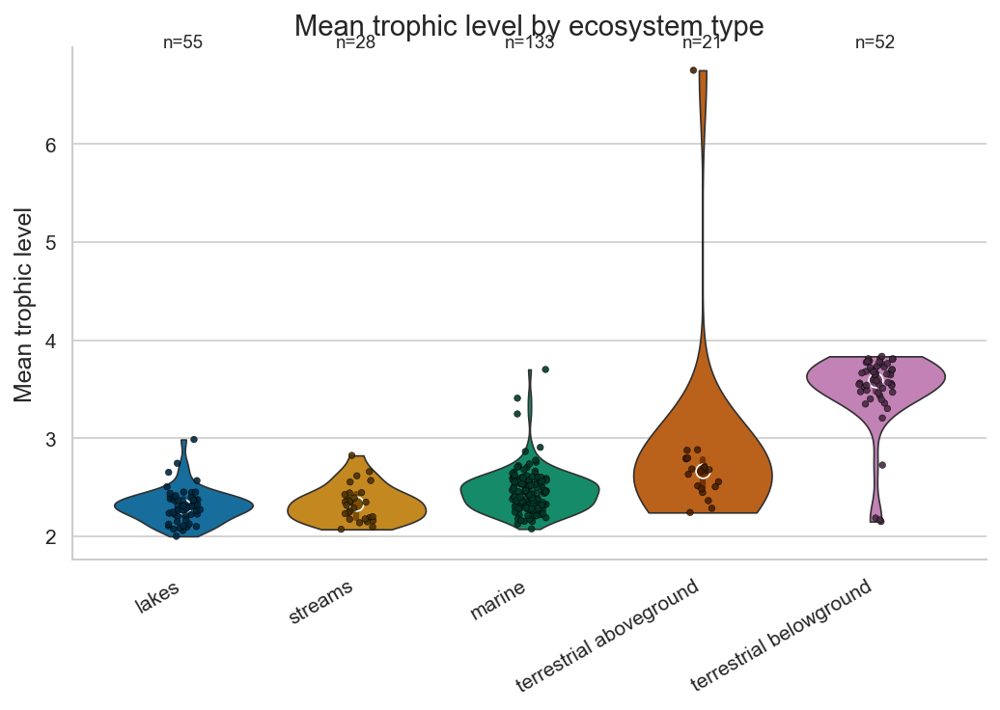

In [14]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb

# ---------- Config ----------
INPUT_CSV = "../../data/processed/Average_Trophic_Size_Height_Gateway_Dataset/mean_tl.csv"
ECO_COL = "Ecosystem_type"
TL_COL  = "Mean_Trophic_Level"

# ---------- Load & tidy ----------
df = pd.read_csv(INPUT_CSV)
if ECO_COL not in df.columns:
    ECO_COL = [c for c in df.columns if c.lower() == "ecosystem_type"][0]
if TL_COL not in df.columns:
    TL_COL = [c for c in df.columns if c.lower() == "mean_trophic_level"][0]
df = df.dropna(subset=[ECO_COL, TL_COL]).copy()

order = (
    df.groupby(ECO_COL)[TL_COL]
      .median()
      .sort_values()
      .index
      .tolist()
)
counts = df.groupby(ECO_COL)[TL_COL].size().reindex(order).rename("n")

# ---------- Palette ----------
# darker, color-blind friendly base
base = sns.color_palette("colorblind", n_colors=len(order))
palette = dict(zip(order, base))

# --- replace the palette_pts block ---
def darken(color, factor=0.35):  # stronger darkening (smaller = darker)
    r, g, b = to_rgb(color)
    return (r*factor, g*factor, b*factor)

palette_pts = {k: darken(c, 0.35) for k, c in palette.items()}   # very dark points
palette_med = {k: darken(c, 0.55) for k, c in palette.items()}   # medium-dark medians/IQR

# ---------- Plot ----------
sns.set_theme(style="whitegrid", context="paper")
plt.rcParams.update({
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
})

fig, ax = plt.subplots(figsize=(7, 5), dpi=150)

# Violin (set hue to avoid FutureWarning)
sns.violinplot(
    data=df, x=ECO_COL, y=TL_COL,
    order=order, hue=ECO_COL, dodge=False,
    inner=None, cut=0, linewidth=0.8,
    palette=palette, ax=ax
)

# Jittered points (visible but subtle)
sns.stripplot(
    data=df, x=ECO_COL, y=TL_COL,
    order=order, hue=ECO_COL, dodge=False,
    palette=palette_pts,
    alpha=0.9,            # more opaque
    size=3.2,             # slightly bigger dots
    edgecolor="black",    # thin black edge for contrast
    linewidth=0.25,
    zorder=5,             # keep points on top of violins
    ax=ax,
)

# Remove duplicate legend (hue==x)
leg = ax.get_legend()
if leg is not None:
    leg.remove()

# Median & IQR overlays (darkened color so dots stand out)
summary = (
    df.groupby(ECO_COL)[TL_COL]
      .agg(median="median",
           q1=lambda x: np.percentile(x, 25),
           q3=lambda x: np.percentile(x, 75))
      .reindex(order)
)

for i, eco in enumerate(order):
    med = summary.loc[eco, "median"]
    q1  = summary.loc[eco, "q1"]
    q3  = summary.loc[eco, "q3"]
    c_med = palette_med[eco]
    ax.plot([i, i], [q1, q3], lw=3, color=c_med, zorder=3)                # IQR
    ax.scatter([i], [med], s=50, color=c_med, edgecolor="white",
               linewidth=0.8, zorder=4)                                   # median dot

# Labels, title, and compact n annotations
ax.set_xlabel("")
ax.set_ylabel("Mean trophic level")
ax.set_title("Mean trophic level by ecosystem type")

ymax = df[TL_COL].max()
pad = (df[TL_COL].max() - df[TL_COL].min()) * 0.04 or 0.12  # smaller pad to avoid title overlap
for i, eco in enumerate(order):
    ax.text(i, ymax + pad, f"n={int(counts.loc[eco])}",
            ha="center", va="bottom", fontsize=9)

plt.xticks(rotation=30, ha="right")
sns.despine()
plt.tight_layout()
plt.show()

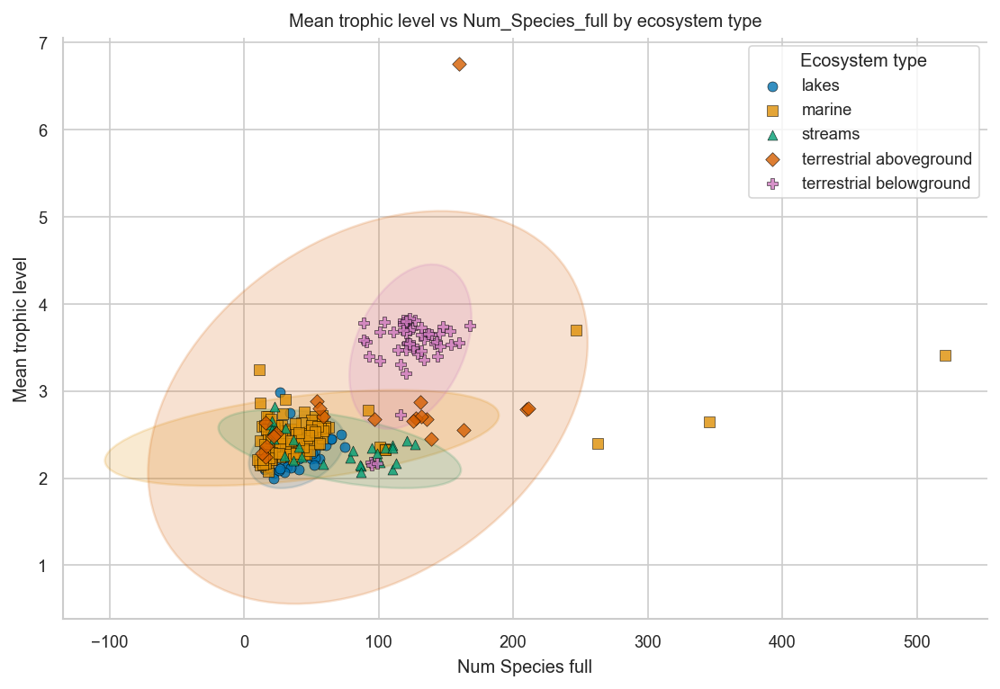

In [16]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from scipy.stats import chi2

# ---------------- Config ----------------
INPUT_CSV   = "../../data/processed/Average_Trophic_Size_Height_Gateway_Dataset/mean_tl.csv"
ECO_COL     = "Ecosystem_type"
X_COL       = "Num_Species_full"
Y_COL       = "Mean_Trophic_Level"
LOG_X       = False           # set True to use log10 scale on the x-axis
SHOW_ELLIPSES = True          # set False to hide 95% covariance ellipses

# ---------------- Load ----------------
df = pd.read_csv(INPUT_CSV)

# Tolerant to lowercase variants
def resolve(col, lower):
    return col if col in df.columns else [c for c in df.columns if c.lower() == lower][0]

ECO_COL = resolve(ECO_COL, "ecosystem_type")
X_COL   = resolve(X_COL, "num_species_full")
Y_COL   = resolve(Y_COL, "mean_trophic_level")

df = df[[ECO_COL, X_COL, Y_COL]].dropna().copy()
df[X_COL] = df[X_COL].astype(float)
df[Y_COL] = df[Y_COL].astype(float)

# ---------------- Palette + markers ----------------
ecos = sorted(df[ECO_COL].unique().tolist())
palette = dict(zip(ecos, sns.color_palette("colorblind", n_colors=len(ecos))))
markers = ["o", "s", "^", "D", "P", "X", "*"]  # enough distinct shapes
marker_map = dict(zip(ecos, markers))

# ---------------- Helper: covariance ellipse ----------------
def add_cov_ellipse(ax, x, y, color, alpha=0.15, lw=1.0, z=2, conf=0.95):
    """
    Draw a 2D covariance ellipse for points (x,y).
    Width/height derived from eigenvalues of covariance; angle from eigenvectors.
    """
    if len(x) < 3:
        return  # not enough points for covariance
    X = np.column_stack([x, y])
    cov = np.cov(X, rowvar=False)
    # Handle singular covariance gracefully
    try:
        vals, vecs = np.linalg.eigh(cov)
    except np.linalg.LinAlgError:
        return
    order = np.argsort(vals)[::-1]
    vals, vecs = vals[order], vecs[:, order]
    # Chi-square scaling for confidence contour
    chi2_val = chi2.ppf(conf, df=2)
    width, height = 2 * np.sqrt(vals * chi2_val)
    angle = np.degrees(np.arctan2(*vecs[:, 0][::-1]))
    mean = X.mean(axis=0)
    e = Ellipse(xy=mean, width=width, height=height, angle=angle,
                facecolor=color, edgecolor=color, alpha=alpha, lw=lw, zorder=z)
    ax.add_patch(e)

# ---------------- Plot ----------------
sns.set_theme(style="whitegrid", context="paper")
fig, ax = plt.subplots(figsize=(7.5, 5.2), dpi=150)

# Points colored by ecosystem type (and distinct markers)
for eco in ecos:
    g = df[df[ECO_COL] == eco]
    ax.scatter(
        g[X_COL], g[Y_COL],
        s=28, alpha=0.8, linewidth=0.3, edgecolor="black",
        color=palette[eco], marker=marker_map[eco], label=eco, zorder=3
    )
    if SHOW_ELLIPSES and len(g) >= 5:
        add_cov_ellipse(ax, g[X_COL].values, g[Y_COL].values, palette[eco], alpha=0.18, lw=1.2, z=2)

# Axes formatting
if LOG_X:
    ax.set_xscale("log")
    ax.set_xlabel(f"log10({X_COL.replace('_',' ')})")
else:
    ax.set_xlabel(X_COL.replace("_", " "))

ax.set_ylabel("Mean trophic level")
ax.set_title("Mean trophic level vs Num_Species_full by ecosystem type")

# Legend outside the plot
ax.legend(title="Ecosystem type", loc="upper right")

sns.despine()
plt.tight_layout()
plt.show()

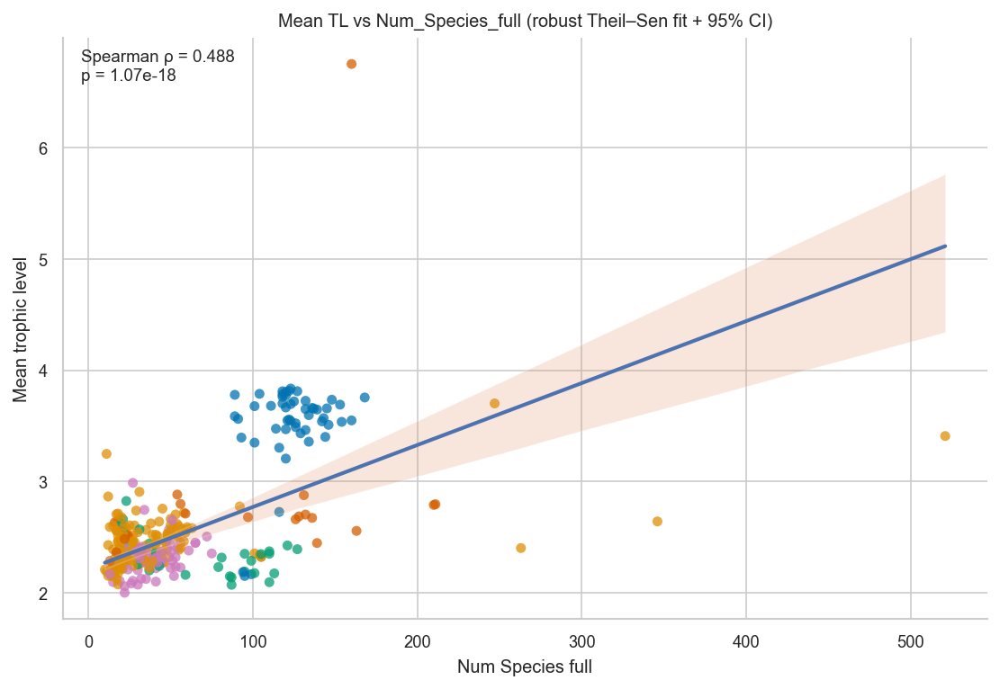

In [15]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import TheilSenRegressor
from scipy.stats import spearmanr

# ---------------- Config ----------------
INPUT_CSV = "../../data/processed/Average_Trophic_Size_Height_Gateway_Dataset/mean_tl.csv"
ECO_COL   = "Ecosystem_type"         # optional (for point colors)
X_COL     = "Num_Species_full"
Y_COL     = "Mean_Trophic_Level"
LOG_X     = False                    # set True if you prefer log10 on species count
N_BOOT    = 800                      # bootstrap replicates for CI (200–2000 is typical)
RNG_SEED  = 42

# ---------------- Load ----------------
df = pd.read_csv(INPUT_CSV)
# tolerant to lowercase variants
for col, name in [(ECO_COL, "ecosystem_type"), (X_COL, "num_species_full"), (Y_COL, "mean_trophic_level")]:
    if col not in df.columns:
        alt = [c for c in df.columns if c.lower() == name]
        if alt: 
            if col == ECO_COL: ECO_COL = alt[0]
            if col == X_COL:    X_COL  = alt[0]
            if col == Y_COL:    Y_COL  = alt[0]

df = df[[ECO_COL, X_COL, Y_COL]].dropna().copy()

# transform X if requested
if LOG_X:
    df["_X"] = np.log10(df[X_COL].astype(float))
    x_label = f"log10({X_COL.replace('_',' ')})"
else:
    df["_X"] = df[X_COL].astype(float)
    x_label = X_COL.replace("_", " ")

X = df[["_X"]].values
y = df[Y_COL].values

# ---------------- Robust fit (Theil–Sen) ----------------
robust = TheilSenRegressor(random_state=RNG_SEED)
robust.fit(X, y)

# grid for smooth line
x_grid = np.linspace(X.min(), X.max(), 300).reshape(-1, 1)
y_hat  = robust.predict(x_grid)

# ---------------- 95% bootstrap band ----------------
rng = np.random.default_rng(RNG_SEED)
preds = np.empty((N_BOOT, len(x_grid)), dtype=float)

for b in range(N_BOOT):
    idx = rng.integers(0, len(X), len(X))
    model = TheilSenRegressor(random_state=RNG_SEED + b)
    model.fit(X[idx], y[idx])
    preds[b] = model.predict(x_grid)

low, high = np.percentile(preds, [2.5, 97.5], axis=0)

# Optional: Spearman correlation for the caption
rho, pval = spearmanr(df[X_COL], df[Y_COL], nan_policy="omit")

# ---------------- Plot ----------------
sns.set_theme(style="whitegrid", context="paper")
fig, ax = plt.subplots(figsize=(7.5, 5.2), dpi=150)

# points (colored by ecosystem type; remove hue=ECO_COL to make all grey)
sns.scatterplot(
    data=df, x="_X", y=Y_COL, hue=ECO_COL, palette="colorblind",
    s=28, alpha=0.75, linewidth=0, ax=ax, legend=False
)

# CI band
ax.fill_between(
    x_grid.ravel(), low, high, alpha=0.2
)

# robust regression line (on top)
ax.plot(x_grid, y_hat, linewidth=2)

# labels and title
ax.set_xlabel(x_label)
ax.set_ylabel("Mean trophic level")
ax.set_title("Mean TL vs Num_Species_full (robust Theil–Sen fit + 95% CI)")

# Optional: show rho in a corner
ax.text(0.02, 0.98, f"Spearman ρ = {rho:.3f}\np = {pval:.3g}",
        ha="left", va="top", transform=ax.transAxes, fontsize=9)

# tidy
sns.despine()
plt.tight_layout()
plt.show()